# setup

In [34]:
import os
local_path = 'C:/Users/jonathan/Documents/capstone_glambie'
os.chdir(local_path)

#load libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib as mpl
import matplotlib.colors as colors
import matplotlib.cm as cmx


import urllib.request as url
import glob
import csv
from pathlib import Path
from scipy.stats import spearmanr

from glambie_demo_notebooks.helpers import glambie_regions_dropdown, glambie_years_dropdown, derivative_to_cumulative, load_all_region_dataframes
from glambie_demo_notebooks.plotting import global_cumulative_plot, global_comparison_stacked_region_plot, histogram_of_region_contributions_to_global_loss_two_years, histogram_of_region_contributions_to_global_loss, histogram_of_region_contributions_to_global_loss_two_years, global_stacked_all_regions_plot
from glambie_demo_notebooks.plotting import single_region_derivative_plot, single_region_cumulative_plot, two_region_comparison_plot, transform_string
from glambie.const import regions
from glambie.data import timeseries

sns.set_theme(palette='colorblind', style='white', font_scale=1.2)
sns.set_style({'axes.linewidth': 2, 'axes.edgecolor':'lightgrey'})

colors_list = sns.color_palette(palette='colorblind', n_colors=18, desat=0.9)
colors_list = list(plt.colormaps["tab10"].colors)

In [35]:
#data_directory = os.path.join(local_path, 'glambie_results_20240716/calendar_years/')
#define data directories
d_dir_normal = 'C:/Users/jonathan/Documents/capstone_glambie/input/glambie_runs_clean/datasets_default/calendar_years/'
d_dir_2012 = 'C:/Users/jonathan/Documents/capstone_glambie/input/glambie_runs_clean/datasets_including_gravimetry/calendar_years/'
d_dir_2023 = 'C:/Users/jonathan/Documents/capstone_glambie/input/glambie_runs_clean/datasets_including_most/calendar_years'


#get a list of all the regions/folders excluding global
list_of_folders = sorted(os.listdir(d_dir_normal)) #sorted(os.listdir(d_dir_normal)[1:20])
list_of_folders

['0_global.csv',
 '10_north_asia.csv',
 '11_central_europe.csv',
 '12_caucasus_middle_east.csv',
 '13_central_asia.csv',
 '14_south_asia_west.csv',
 '15_south_asia_east.csv',
 '16_low_latitudes.csv',
 '17_southern_andes.csv',
 '18_new_zealand.csv',
 '19_antarctic_and_subantarctic.csv',
 '1_alaska.csv',
 '2_western_canada_us.csv',
 '3_arctic_canada_north.csv',
 '4_arctic_canada_south.csv',
 '5_greenland_periphery.csv',
 '6_iceland.csv',
 '7_svalbard.csv',
 '8_scandinavia.csv',
 '9_russian_arctic.csv']

# functions

## data

In [36]:
def difference_between_runs_plot(data_run_1, data_run_2):
    #merge 
    merged_df = data_run_1.merge(data_run_2, on= ('start_dates', 'end_dates', 'region'),suffixes=('_1', '_2'), copy = False)

    #calculate difference
    merged_df['gt_difference'] = merged_df.combined_gt_2 - merged_df.combined_gt_1
    merged_df['gt_errors_difference'] = merged_df.combined_gt_errors_2 - merged_df.combined_gt_errors_1

    merged_df['mwe_difference'] = merged_df.combined_mwe_2 - merged_df.combined_mwe_1
    merged_df['mwe_errors_difference'] = np.abs(merged_df.combined_mwe_errors_2 - merged_df.combined_mwe_errors_1)

    return merged_df

In [37]:
def compute_all_metrics_gt(df1, df2):
    merged = pd.merge(df1, df2, on="start_dates", suffixes=("_run1", "_run2"), how="outer")
    cumul_run1 = merged["combined_gt_run1"].sum()
    cumul_run2 = merged["combined_gt_run2"].sum()
    if abs(cumul_run1) > 0.01:
        rel_diff = (cumul_run2 - cumul_run1) / abs(cumul_run1) * 100.0
    else:
        rel_diff = 0.0
    abs_diff = cumul_run2 - cumul_run1
    corr, _ = spearmanr(merged["combined_gt_run1"], merged["combined_gt_run2"])
    return rel_diff, abs_diff, corr

In [38]:
def compute_all_metrics_mwe(df1, df2):
    merged = pd.merge(df1, df2, on="start_dates", suffixes=("_run1", "_run2"), how="outer")
    cumul_run1 = merged["combined_mwe_run1"].sum()
    cumul_run2 = merged["combined_mwe_run2"].sum()
    if abs(cumul_run1) > 0.01:
        rel_diff = (cumul_run2 - cumul_run1) / abs(cumul_run1) * 100.0
    else:
        rel_diff = 0.0
    abs_diff = cumul_run2 - cumul_run1
    corr, _ = spearmanr(merged["combined_mwe_run1"], merged["combined_mwe_run2"])
    return rel_diff, abs_diff, corr

In [39]:
def compute_relative_diff_timeseries(df1, df2):
    merged = pd.merge(df1, df2, on="start_dates", suffixes=("_run1", "_run2"), how="outer")
    gt_run1 = merged["combined_gt_run1"]
    gt_run2 = merged["combined_gt_run2"]
    mwe_run1 = merged["combined_mwe_run1"]
    mwe_run2 = merged["combined_mwe_run2"]
    
    rel_diff_gt = (gt_run2 - gt_run1) / abs(gt_run1) * 100.0
    rel_diff_mwe = (mwe_run2 - mwe_run1) / abs(mwe_run1) * 100.0

    rel_diff_df = pd.DataFrame({
        'start_dates': merged['start_dates'],
        'gt_difference': rel_diff_gt,
        'mwe_difference': rel_diff_mwe
    })
    return rel_diff_df

## plots

### two runs

In [40]:
def two_runs_comparison_plot(region_name, data_distinction, comparison_data_distinction, data_run_1, data_run_2):
    
    _, axs = plt.subplots(1, 2, figsize=(20,8))

    #plot 1 = gt changes timeseries 
    axs[0].set_xlim(2000,2024)

    axs[0].hlines(0, 2000, 2024, linewidth=2, colors=['grey'], linestyle='dashed')

    #dataset 1
    axs[0].plot(data_run_1.start_dates + 0.5, data_run_1.combined_gt, linewidth=3, zorder=2, label=region_name + ' - ' + data_distinction)
    axs[0].fill_between(data_run_1.start_dates + 0.5, data_run_1.combined_gt - data_run_1.combined_gt_errors,
                        data_run_1.combined_gt + data_run_1.combined_gt_errors, alpha=0.2)

    #dataset 2
    axs[0].plot(data_run_2.start_dates + 0.5, data_run_2.combined_gt, linewidth=3, zorder=2, label=region_name + ' - ' + comparison_data_distinction)
    axs[0].fill_between(data_run_2.start_dates + 0.5, data_run_2.combined_gt - data_run_2.combined_gt_errors,
                        data_run_2.combined_gt + data_run_2.combined_gt_errors, alpha=0.2)

    axs[0].set_xlabel('Year')
    axs[0].set_ylabel('Mass Change (Gt)')
    axs[0].grid(True, alpha=0.8)

    ###########3
    #plot 2 = mwe changes timeseries
    axs[1].set_xlim(2000,2024)

    axs[1].hlines(0, 2000, 2024, linewidth=2, colors=['grey'], linestyle='dashed')

    #dataset 1
    axs[1].plot(data_run_1.start_dates + 0.5, data_run_1.combined_mwe, linewidth=3, zorder=2, label=region_name + ' - ' + data_distinction)
    axs[1].fill_between(data_run_1.start_dates + 0.5, data_run_1.combined_mwe - data_run_1.combined_mwe_errors,
                        data_run_1.combined_mwe + data_run_1.combined_mwe_errors, alpha=0.2)

    axs[1].plot(data_run_2.start_dates + 0.5, data_run_2.combined_mwe, linewidth=3, zorder=2, label=region_name + ' - ' + comparison_data_distinction)
    axs[1].fill_between(data_run_2.start_dates + 0.5, data_run_2.combined_mwe - data_run_2.combined_mwe_errors,
                        data_run_2.combined_mwe + data_run_2.combined_mwe_errors, alpha=0.2)

    axs[1].set_xlabel('Year')
    axs[1].set_ylabel('Mass Change (mwe)')

    axs[0].legend(loc = 'lower left', fontsize=16)
    plt.suptitle(region_name + ': comparison ' + data_distinction + ' and ' + comparison_data_distinction + ': total ice loss, 2000 - 2024', fontsize=18)
    axs[1].grid(True, alpha=0.8)


    return

In [41]:
def two_runs_cumulative_comparison_plot(region_name, data_distinction, comparison_data_distinction, cumulative_data_all_gt, cumulative_errors_all_gt, cumulative_data_all_gt_comparison,
                               cumulative_errors_all_gt_comparison, cumulative_data_all_mwe, cumulative_errors_all_mwe,
                               cumulative_data_all_mwe_comparison, cumulative_errors_all_mwe_comparison):
    
    _, axs = plt.subplots(1, 2, figsize=(20,8))

    #plot 1 
    axs[0].set_xlim(2000,2024)
    axs[0].hlines(0, 2000, 2024, linewidth=2, colors=['grey'], linestyle='dashed')

    axs[0].plot(cumulative_data_all_gt.dates, cumulative_data_all_gt.changes, linewidth=3, zorder=2, label=region_name + ' - ' + data_distinction)
    axs[0].fill_between(cumulative_data_all_gt.dates, cumulative_data_all_gt.changes - cumulative_errors_all_gt.errors,
                        cumulative_data_all_gt.changes + cumulative_errors_all_gt.errors, alpha=0.2)

    axs[0].plot(cumulative_data_all_gt_comparison.dates, cumulative_data_all_gt_comparison.changes, linewidth=3, zorder=2, label=region_name + ' - ' + comparison_data_distinction)
    axs[0].fill_between(cumulative_data_all_gt_comparison.dates, cumulative_data_all_gt_comparison.changes - cumulative_errors_all_gt_comparison.errors,
                        cumulative_data_all_gt_comparison.changes + cumulative_errors_all_gt_comparison.errors, alpha=0.2)

    axs[0].set_xlabel('Year')
    axs[0].set_ylabel('Cumulative Change [Gt]')
    axs[0].grid(True, alpha=0.8)

    #plot 2
    axs[1].set_xlim(2000,2024)
    axs[1].hlines(0, 2000, 2024, linewidth=2, colors=['grey'], linestyle='dashed')

    axs[1].plot(cumulative_data_all_mwe.dates, cumulative_data_all_mwe.changes, linewidth=3, zorder=2, label=region_name + ' - ' + data_distinction)
    axs[1].fill_between(cumulative_data_all_mwe.dates, cumulative_data_all_mwe.changes - cumulative_errors_all_mwe.errors,
                        cumulative_data_all_mwe.changes + cumulative_errors_all_mwe.errors, alpha=0.2)

    axs[1].plot(cumulative_data_all_mwe_comparison.dates, cumulative_data_all_mwe_comparison.changes, linewidth=3, zorder=2, label=region_name + ' - ' + comparison_data_distinction)
    axs[1].fill_between(cumulative_data_all_mwe_comparison.dates, cumulative_data_all_mwe_comparison.changes - cumulative_errors_all_mwe_comparison.errors,
                        cumulative_data_all_mwe_comparison.changes + cumulative_errors_all_mwe_comparison.errors, alpha=0.2)

    axs[1].set_xlabel('Year')
    axs[1].set_ylabel('Cumulative Change [metres water equivalent]')

    axs[0].legend(loc = 'lower left', fontsize=16)
    plt.suptitle(region_name + ': comparison ' + data_distinction + ' and ' + comparison_data_distinction + ': total ice loss, 2000 - 2023', fontsize=18)
    axs[1].grid(True, alpha=0.8)


    return

In [42]:
def two_runs_difference_plot(region_name, data_distinction, comparison_data_distinction, difference_data):
    
    _, axs = plt.subplots(1, 2, figsize=(20,8))

    #plot 1 = gt changes timeseries 
    axs[0].set_xlim(2000,2024)

    axs[0].hlines(0, 2000, 2024, linewidth=2, colors=['grey'], linestyle='dashed')
    axs[0].plot(difference_data.start_dates + 0.5, difference_data.gt_difference, linewidth=3, zorder=2, label=region_name + ' - ' + data_distinction)

    axs[0].set_xlabel('Year')
    axs[0].set_ylabel('Difference in Mass Change (Gt)')
    axs[0].grid(True, alpha=0.8)

    ###########3
    #plot 2 = mwe changes timeseries
    axs[1].set_xlim(2000,2024)

    axs[1].hlines(0, 2000, 2024, linewidth=2, colors=['grey'], linestyle='dashed')
    axs[1].plot(difference_data.start_dates + 0.5, difference_data.mwe_difference, linewidth=3, zorder=2, label=region_name + ' - ' + data_distinction)

    axs[1].set_xlabel('Year')
    axs[1].set_ylabel('Difference in Mass Change (mwe)')

    axs[0].legend(loc = 'lower left', fontsize=16)
    plt.suptitle(region_name + ': Difference in ice loss ' + data_distinction + ' and ' + comparison_data_distinction, fontsize=18)
    axs[1].grid(True, alpha=0.8)


    return

### three runs

In [43]:
def three_runs_comparison_plot(region_name, data_distinction_1, data_distinction_2, data_distinction_3, data_run_1, data_run_2, data_run_3):
    
    _, axs = plt.subplots(1, 2, figsize=(20,8))

    #plot 1 = gt changes timeseries 
    axs[0].set_xlim(2000,2024)

    axs[0].hlines(0, 2000, 2024, linewidth=2, colors=['grey'], linestyle='dashed')

    #dataset 1
    axs[0].plot(data_run_1.start_dates + 0.5, data_run_1.combined_gt, linewidth=3, zorder=2, label=region_name + ' - ' + data_distinction_1)
    axs[0].fill_between(data_run_1.start_dates + 0.5, data_run_1.combined_gt - data_run_1.combined_gt_errors,
                        data_run_1.combined_gt + data_run_1.combined_gt_errors, alpha=0.2)

    #dataset 2
    axs[0].plot(data_run_2.start_dates + 0.5, data_run_2.combined_gt, linewidth=3, zorder=2, label=region_name + ' - ' + data_distinction_2)
    axs[0].fill_between(data_run_2.start_dates + 0.5, data_run_2.combined_gt - data_run_2.combined_gt_errors,
                        data_run_2.combined_gt + data_run_2.combined_gt_errors, alpha=0.2)

    #dataset 3
    axs[0].plot(data_run_3.start_dates + 0.5, data_run_3.combined_gt, linewidth=3, zorder=2, label=region_name + ' - ' + data_distinction_3)
    axs[0].fill_between(data_run_3.start_dates + 0.5, data_run_3.combined_gt - data_run_3.combined_gt_errors,
                        data_run_3.combined_gt + data_run_3.combined_gt_errors, alpha=0.2)

    axs[0].set_xlabel('Year')
    axs[0].set_ylabel('Mass Change (Gt)')
    axs[0].grid(True, alpha=0.8)

    ###########3
    #plot 2 = mwe changes timeseries
    axs[1].set_xlim(2000,2024)

    axs[1].hlines(0, 2000, 2024, linewidth=2, colors=['grey'], linestyle='dashed')

    #dataset 1
    axs[1].plot(data_run_1.start_dates + 0.5, data_run_1.combined_mwe, linewidth=3, zorder=2, label=region_name + ' - ' + data_distinction_1)
    axs[1].fill_between(data_run_1.start_dates + 0.5, data_run_1.combined_mwe - data_run_1.combined_mwe_errors,
                        data_run_1.combined_mwe + data_run_1.combined_mwe_errors, alpha=0.2)

    axs[1].plot(data_run_2.start_dates + 0.5, data_run_2.combined_mwe, linewidth=3, zorder=2, label=region_name + ' - ' + data_distinction_2)
    axs[1].fill_between(data_run_2.start_dates + 0.5, data_run_2.combined_mwe - data_run_2.combined_mwe_errors,
                        data_run_2.combined_mwe + data_run_2.combined_mwe_errors, alpha=0.2)

    axs[1].plot(data_run_3.start_dates + 0.5, data_run_3.combined_mwe, linewidth=3, zorder=2, label=region_name + ' - ' + data_distinction_3)
    axs[1].fill_between(data_run_3.start_dates + 0.5, data_run_3.combined_mwe - data_run_3.combined_mwe_errors,
                        data_run_3.combined_mwe + data_run_3.combined_mwe_errors, alpha=0.2)

    axs[1].set_xlabel('Year')
    axs[1].set_ylabel('Mass Change (mwe)')

    axs[0].legend(loc = 'lower left', fontsize=16)
    plt.suptitle(region_name + ': comparison ' + data_distinction_1 + ', ' + data_distinction_2 + ' and ' + data_distinction_3 + ': total ice loss, 2000 - 2024', fontsize=18)
    axs[1].grid(True, alpha=0.8)


    return

In [44]:
def three_runs_cumulative_comparison_plot(region_name, data_distinction_1, data_distinction_2,data_distinction_3, data_run_1, data_run_2, data_run_3):

    #calculate cumulative for normal
    cum_region_gt_1 = derivative_to_cumulative(data_run_1.start_dates, data_run_1.end_dates, data_run_1.combined_gt)
    cum_region_gt_err_1 = derivative_to_cumulative(data_run_1.start_dates, data_run_1.end_dates, data_run_1.combined_gt_errors, calculate_as_errors=True)

    cum_region_mwe_1 = derivative_to_cumulative(data_run_1.start_dates, data_run_1.end_dates, data_run_1.combined_mwe)
    cum_region_mwe_err_1 = derivative_to_cumulative(data_run_1.start_dates, data_run_1.end_dates, data_run_1.combined_mwe_errors, calculate_as_errors=True)

    #calculate cumulative for 2
    cum_region_gt_2 = derivative_to_cumulative(data_run_2.start_dates, data_run_2.end_dates, data_run_2.combined_gt)
    cum_region_gt_err_2 = derivative_to_cumulative(data_run_2.start_dates, data_run_2.end_dates, data_run_2.combined_gt_errors, calculate_as_errors=True)

    cum_region_mwe_2 = derivative_to_cumulative(data_run_2.start_dates, data_run_2.end_dates, data_run_2.combined_mwe)
    cum_region_mwe_err_2 = derivative_to_cumulative(data_run_2.start_dates, data_run_2.end_dates, data_run_2.combined_mwe_errors, calculate_as_errors=True)

    #calculate cumulative for 3
    cum_region_gt_3 = derivative_to_cumulative(data_run_3.start_dates, data_run_3.end_dates, data_run_3.combined_gt)
    cum_region_gt_err_3 = derivative_to_cumulative(data_run_3.start_dates, data_run_3.end_dates, data_run_3.combined_gt_errors, calculate_as_errors=True)

    cum_region_mwe_3 = derivative_to_cumulative(data_run_3.start_dates, data_run_3.end_dates, data_run_3.combined_mwe)
    cum_region_mwe_err_3 = derivative_to_cumulative(data_run_3.start_dates, data_run_3.end_dates, data_run_3.combined_mwe_errors, calculate_as_errors=True)

    #plot
    _, axs = plt.subplots(1, 2, figsize=(20,8))

    #plot 1 
    axs[0].set_xlim(2000,2024)
    axs[0].hlines(0, 2000, 2024, linewidth=2, colors=['grey'], linestyle='dashed')

    axs[0].plot(cum_region_gt_1.dates, cum_region_gt_1.changes, linewidth=3, zorder=2, label=region_name + ' - ' + data_distinction_1)
    axs[0].fill_between(cum_region_gt_1.dates, cum_region_gt_1.changes - cum_region_gt_err_1.errors,
                        cum_region_gt_1.changes + cum_region_gt_err_1.errors, alpha=0.2)

    axs[0].plot(cum_region_gt_2.dates, cum_region_gt_2.changes, linewidth=3, zorder=2, label=region_name + ' - ' + data_distinction_2)
    axs[0].fill_between(cum_region_gt_2.dates, cum_region_gt_2.changes - cum_region_gt_err_2.errors,
                        cum_region_gt_2.changes + cum_region_gt_err_2.errors, alpha=0.2)

    axs[0].plot(cum_region_gt_3.dates, cum_region_gt_3.changes, linewidth=3, zorder=2, label=region_name + ' - ' + data_distinction_3)
    axs[0].fill_between(cum_region_gt_3.dates, cum_region_gt_3.changes - cum_region_gt_err_3.errors,
                        cum_region_gt_3.changes + cum_region_gt_err_3.errors, alpha=0.2)

    axs[0].set_xlabel('Year')
    axs[0].set_ylabel('Cumulative Change [Gt]')
    axs[0].grid(True, alpha=0.8)

    #plot 2
    axs[1].set_xlim(2000,2024)
    axs[1].hlines(0, 2000, 2024, linewidth=2, colors=['grey'], linestyle='dashed')

    axs[1].plot(cum_region_mwe_1.dates, cum_region_mwe_1.changes, linewidth=3, zorder=2, label=region_name + ' - ' + data_distinction_1)
    axs[1].fill_between(cum_region_mwe_1.dates, cum_region_mwe_1.changes - cum_region_mwe_err_1.errors,
                        cum_region_mwe_1.changes + cum_region_mwe_err_1.errors, alpha=0.2)

    axs[1].plot(cum_region_mwe_2.dates, cum_region_mwe_2.changes, linewidth=3, zorder=2, label=region_name + ' - ' + data_distinction_2)
    axs[1].fill_between(cum_region_mwe_2.dates, cum_region_mwe_2.changes - cum_region_mwe_err_2.errors,
                        cum_region_mwe_2.changes + cum_region_mwe_err_2.errors, alpha=0.2)

    axs[1].plot(cum_region_mwe_3.dates, cum_region_mwe_3.changes, linewidth=3, zorder=2, label=region_name + ' - ' + data_distinction_3)
    axs[1].fill_between(cum_region_mwe_3.dates, cum_region_mwe_3.changes - cum_region_mwe_err_3.errors,
                        cum_region_mwe_3.changes + cum_region_mwe_err_3.errors, alpha=0.2)


    axs[1].set_xlabel('Year')
    axs[1].set_ylabel('Cumulative Change [metres water equivalent]')

    axs[0].legend(loc = 'lower left', fontsize=16)
    plt.suptitle(region_name  + data_distinction_1 + ', '+ data_distinction_2 + ' and ' + data_distinction_3 + ': cumulative ice loss, 2000 - 2023', fontsize=18)
    axs[1].grid(True, alpha=0.8)


    return

In [45]:
def three_runs_difference_plot(region_name, data_distinction_1, data_distinction_2, difference_data_1, difference_data_2):
    
    _, axs = plt.subplots(1, 2, figsize=(20,8))

    #plot 1 = gt changes timeseries 
    axs[0].set_xlim(2000,2024)

    axs[0].hlines(0, 2000, 2024, linewidth=2, colors=['grey'], linestyle='dashed')
    axs[0].plot(difference_data_1.start_dates + 0.5, difference_data_1.gt_difference, linewidth=3, zorder=2, label=region_name + ' - ' + data_distinction_1)
    axs[0].plot(difference_data_2.start_dates + 0.5, difference_data_2.gt_difference, linewidth=3, zorder=2, label=region_name + ' - ' + data_distinction_2)


    axs[0].set_xlabel('Year')
    axs[0].set_ylabel('Difference in Mass Change (Gt)')
    axs[0].grid(True, alpha=0.8)

    ###########3
    #plot 2 = mwe changes timeseries
    axs[1].set_xlim(2000,2024)

    axs[1].hlines(0, 2000, 2024, linewidth=2, colors=['grey'], linestyle='dashed')
    axs[1].plot(difference_data_1.start_dates + 0.5, difference_data_1.mwe_difference, linewidth=3, zorder=2, label=region_name + ' - ' + data_distinction_1)
    axs[1].plot(difference_data_2.start_dates + 0.5, difference_data_2.mwe_difference, linewidth=3, zorder=2, label=region_name + ' - ' + data_distinction_2)

    axs[1].set_xlabel('Year')
    axs[1].set_ylabel('Difference in Mass Change (mwe)')

    axs[0].legend(loc = 'lower left', fontsize=16)
    plt.suptitle(region_name + ': Difference in ice loss between runs', fontsize=18)
    axs[1].grid(True, alpha=0.8)


    return

In [46]:
def three_runs_relative_difference_plot(region_name, data_distinction_1, data_distinction_2, difference_data_1, difference_data_2):
    
    _, axs = plt.subplots(1, 2, figsize=(20,8))

    #plot 1 = gt changes timeseries 
    axs[0].set_xlim(2000,2024)

    axs[0].hlines(0, 2000, 2024, linewidth=2, colors=['grey'], linestyle='dashed')
    axs[0].plot(difference_data_1.start_dates + 0.5, difference_data_1.gt_difference, linewidth=3, zorder=2, label=region_name + ' - ' + data_distinction_1)
    axs[0].plot(difference_data_2.start_dates + 0.5, difference_data_2.gt_difference, linewidth=3, zorder=2, label=region_name + ' - ' + data_distinction_2)


    axs[0].set_xlabel('Year')
    axs[0].set_ylabel('Relative difference in Mass Change Gigatonnes (%)')
    axs[0].grid(True, alpha=0.8)

    ###########3
    #plot 2 = mwe changes timeseries
    axs[1].set_xlim(2000,2024)

    axs[1].hlines(0, 2000, 2024, linewidth=2, colors=['grey'], linestyle='dashed')
    axs[1].plot(difference_data_1.start_dates + 0.5, difference_data_1.mwe_difference, linewidth=3, zorder=2, label=region_name + ' - ' + data_distinction_1)
    axs[1].plot(difference_data_2.start_dates + 0.5, difference_data_2.mwe_difference, linewidth=3, zorder=2, label=region_name + ' - ' + data_distinction_2)

    axs[1].set_xlabel('Year')
    axs[1].set_ylabel('Relative difference in Mass Change MWE (%)')

    axs[0].legend(loc = 'lower left', fontsize=16)
    plt.suptitle(region_name + ': Relative difference in ice loss between runs', fontsize=18)
    axs[1].grid(True, alpha=0.8)


    return

# Analysis

## Look at area shape

In [47]:
d_dir_normal

'C:/Users/jonathan/Documents/capstone_glambie/input/glambie_runs_clean/datasets_default/calendar_years/'

In [48]:
#load global datasets
global_normal = pd.read_csv(os.path.join(d_dir_normal, '0_global.csv')).drop('Unnamed: 0', axis=1)
global_2012 = pd.read_csv(os.path.join(d_dir_2012, '0_global.csv')).drop('Unnamed: 0', axis=1)
global_2023 = pd.read_csv(os.path.join(d_dir_2023, '0_global.csv')).drop('Unnamed: 0', axis=1)

global_normal['app'] = 705644/ global_normal.glacier_area * global_normal.combined_mwe

#tryout = timeseries.Timeseries.apply_or_remove_area_change(al_normal,6, apply_area_change=True)
#tryout

global_normal.head()
#global_2023.head()

,start_dates,end_dates,glacier_area,region,combined_gt,combined_gt_errors,combined_mwe,combined_mwe_errors,app
0,2000.0,2001.0,704082.69565,global,-78.044147,111.560951,-0.111179,0.158362,-0.111425
1,2001.0,2002.0,701805.49875,global,-215.169311,95.300101,-0.307516,0.135050,-0.309198
2,2002.0,2003.0,699528.30185,global,-128.466367,91.146345,-0.184200,0.128930,-0.185810
3,2003.0,2004.0,697251.10495,global,-192.672470,72.798877,-0.277163,0.102895,-0.280499
4,2004.0,2005.0,694973.90805,global,-229.236911,73.022158,-0.330842,0.102844,-0.335922


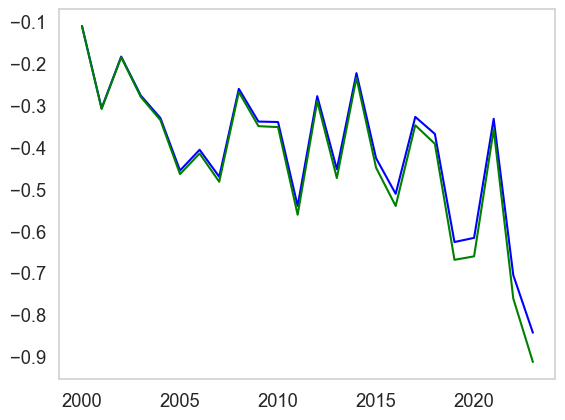

In [49]:
plt.plot(global_normal.start_dates, global_normal.combined_mwe, color='blue' )
plt.plot(global_normal.start_dates, global_normal.app, color='green')

<function matplotlib.pyplot.show(close=None, block=None)>

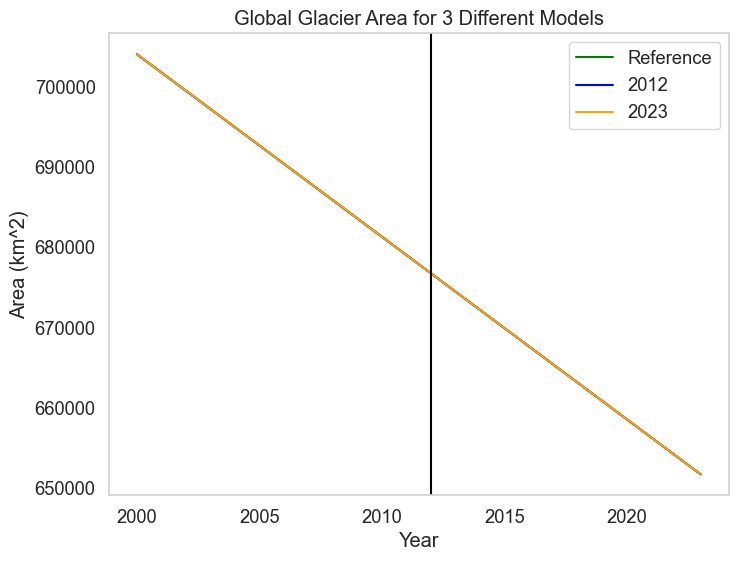

In [50]:
plt.figure(figsize = (8,6))

plt.plot(global_normal.start_dates, global_normal.glacier_area, color='green', label = 'Reference' )
plt.plot(global_2012.start_dates, global_2012.glacier_area, color='blue', label = '2012')
plt.plot(global_2023.start_dates, global_2023.glacier_area, color='orange', label = '2023')

plt.axvline(x= 2012, color='black' )

plt.title('Global Glacier Area for 3 Different Models')

plt.xlabel('Year')
plt.ylabel('Area (km^2)')
plt.legend()
plt.show

#plt.savefig('C:/Users/Milva/Documents/Uni Freiburg/Semester 2.1/capstone/area non static plots/glacier_area_shape.png')

## 2 runs difference

### changes in GT and area

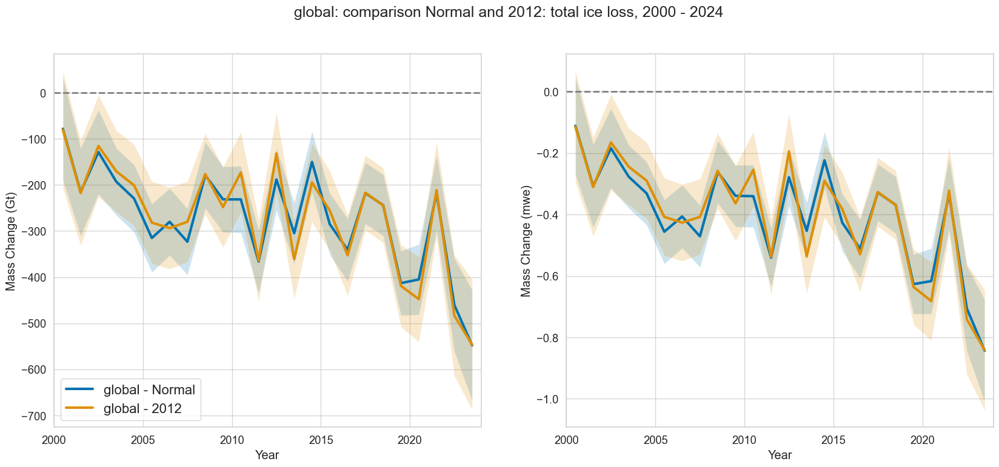

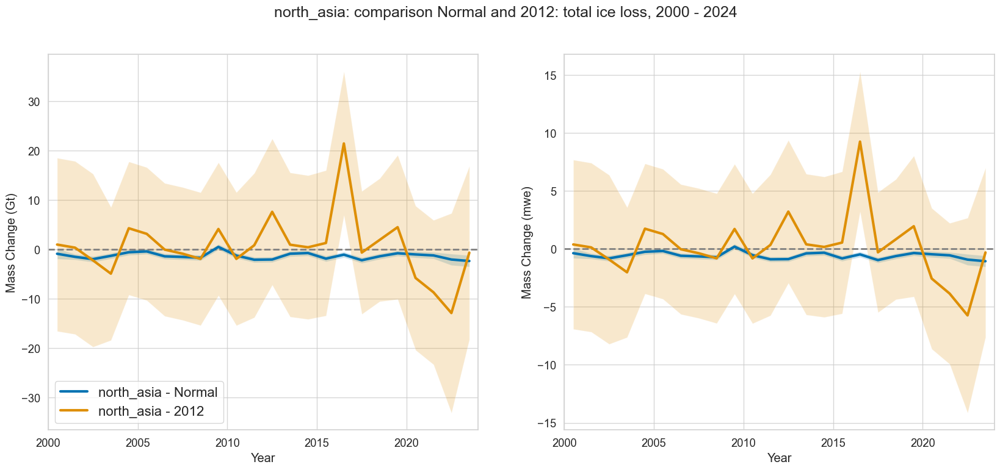

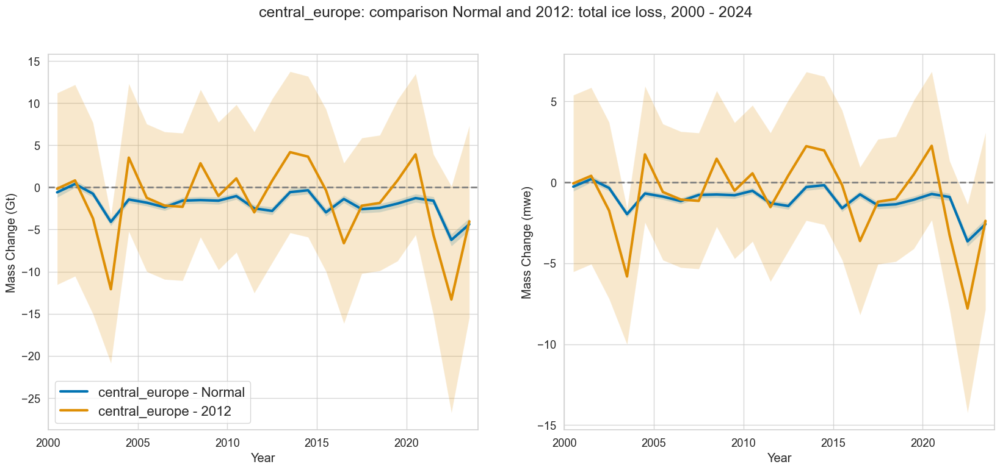

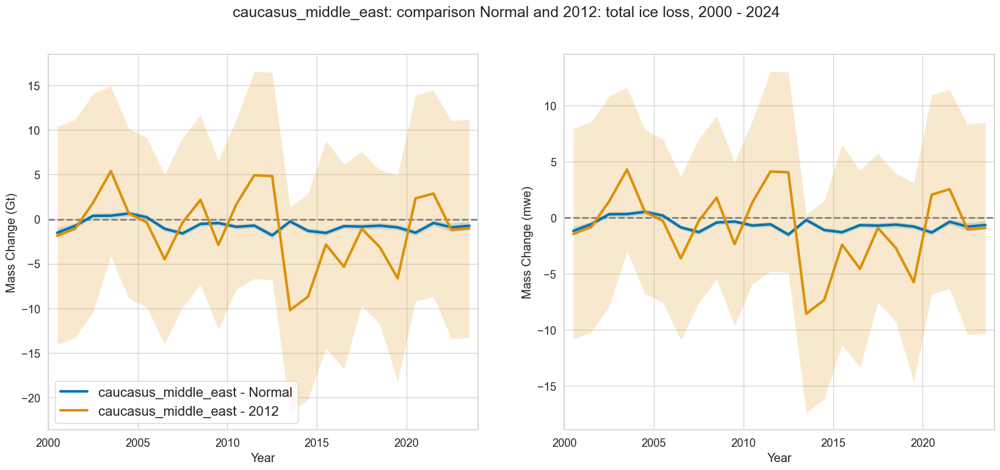

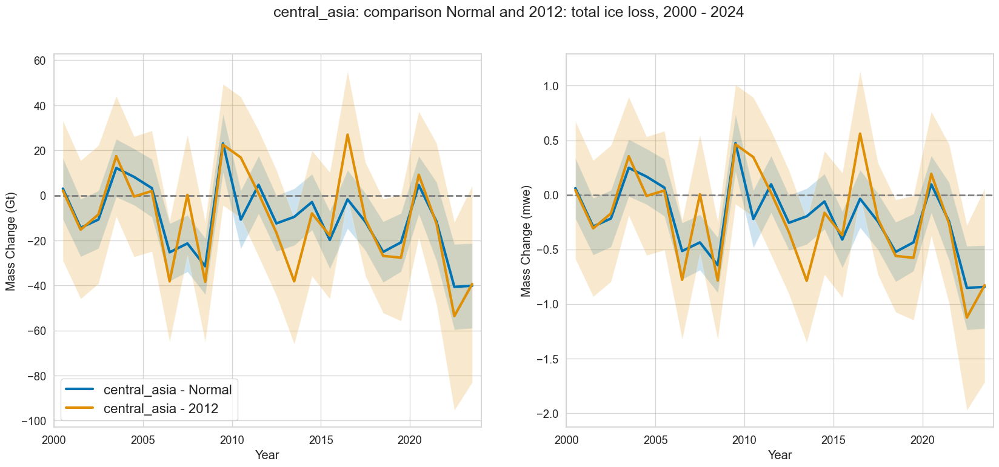

...

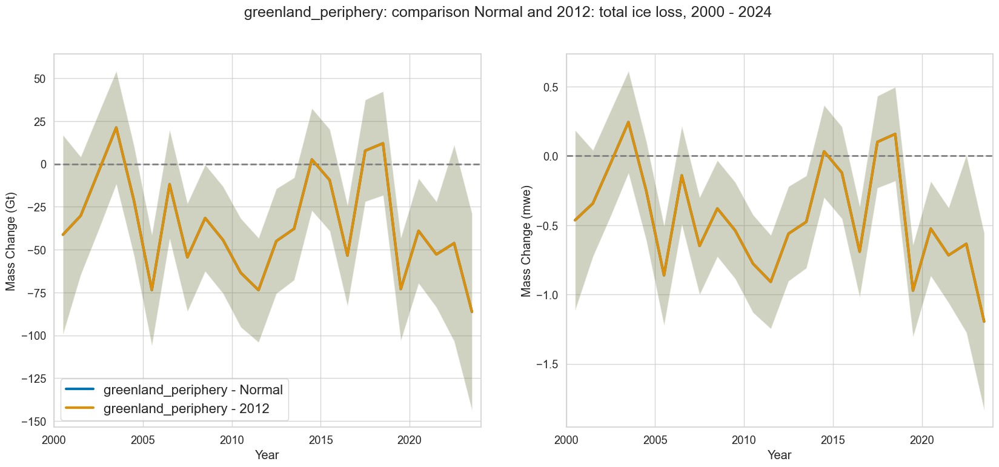

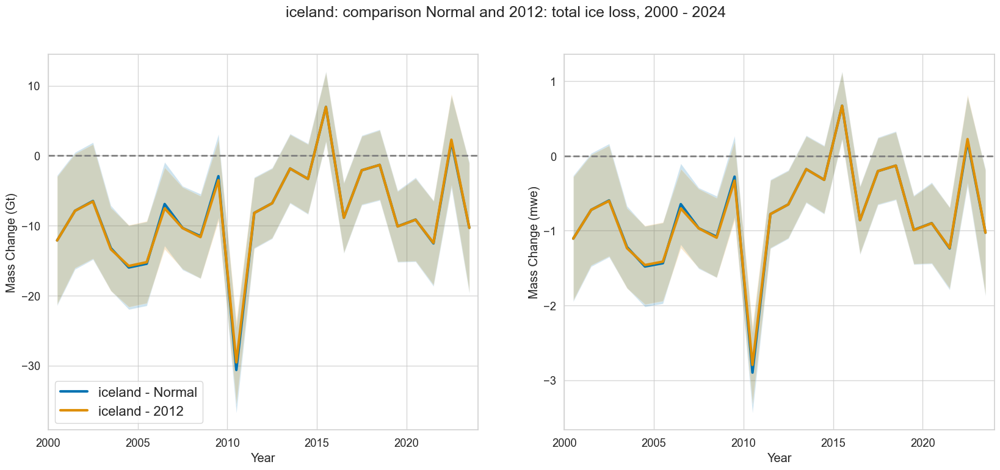

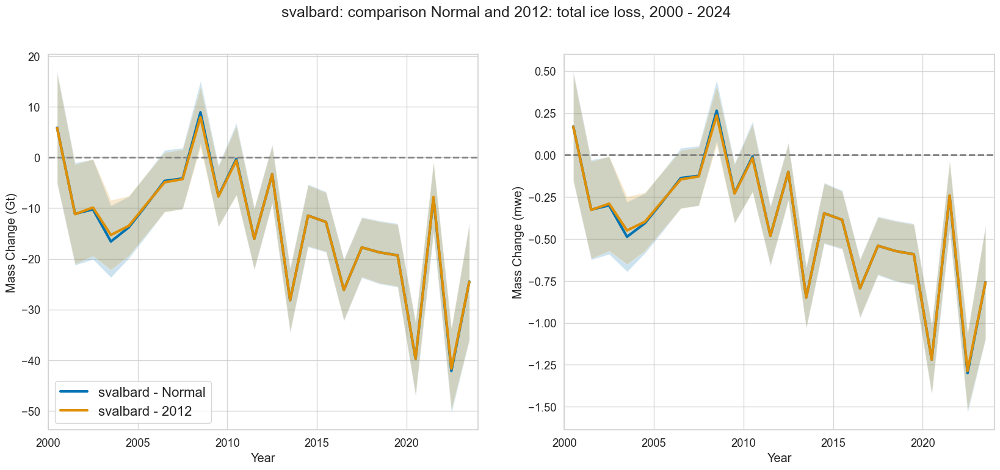

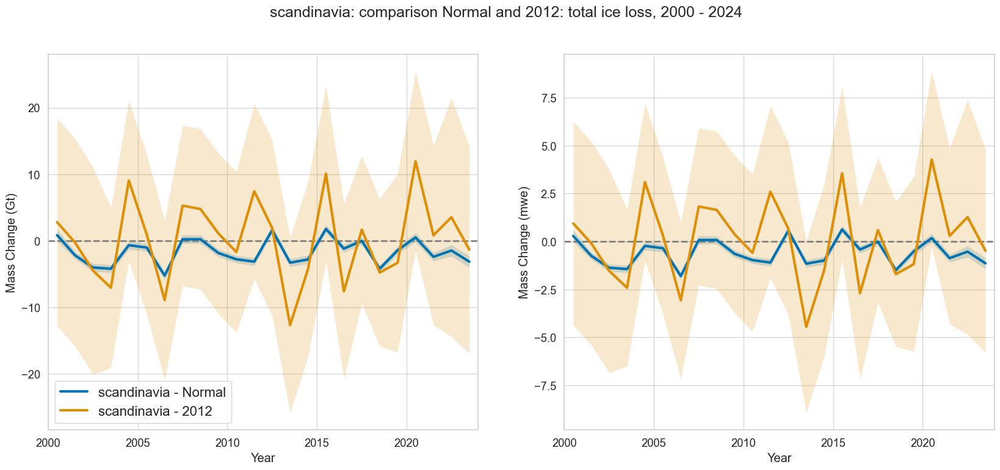

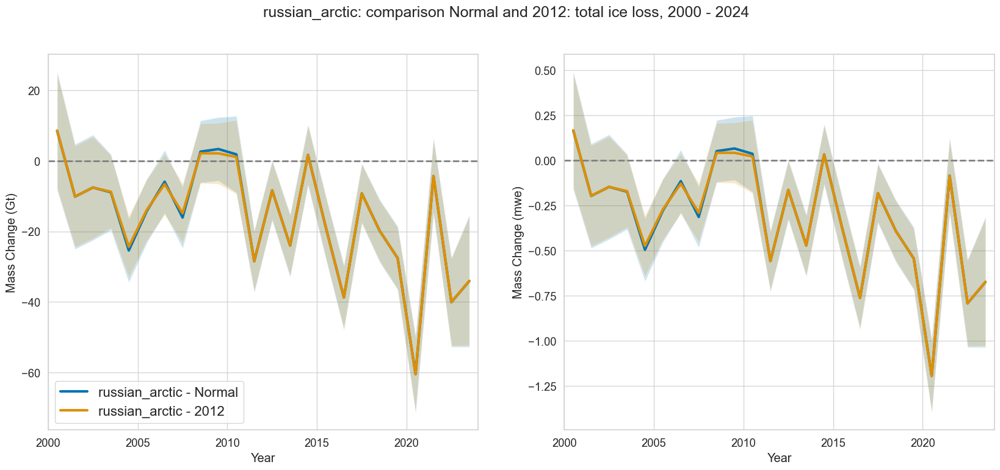

In [51]:
for i in range(0,len(list_of_folders)):
    #define region name and path to results
    region = list_of_folders[i]
    
    #get the region name without  the number
    region_name = region[region.find("_")+1:-4]

    #read in the data
    region_normal_df = pd.read_csv(os.path.join(d_dir_normal, region)).drop('Unnamed: 0', axis=1)
    region_comparison_df = pd.read_csv(os.path.join(d_dir_2012, region)).drop('Unnamed: 0', axis=1)

    #plot
    two_runs_comparison_plot(region_name, 'Normal', '2012', region_normal_df, region_comparison_df)


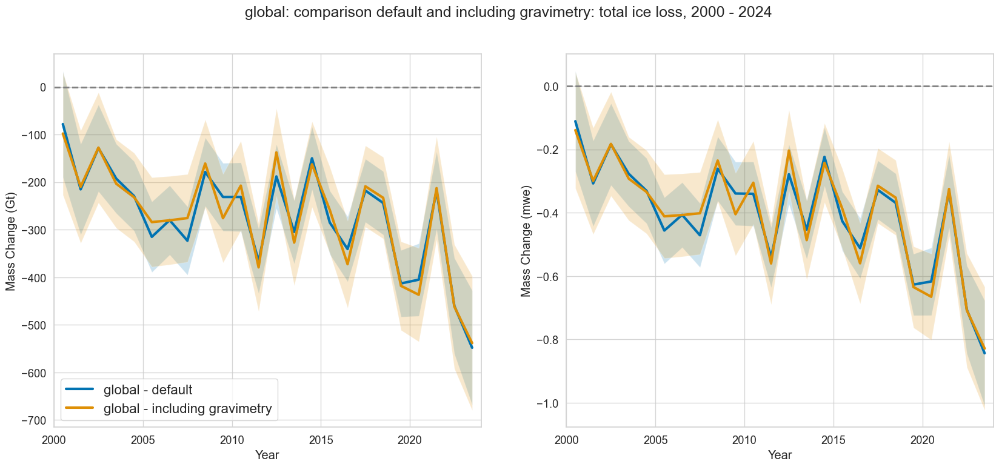

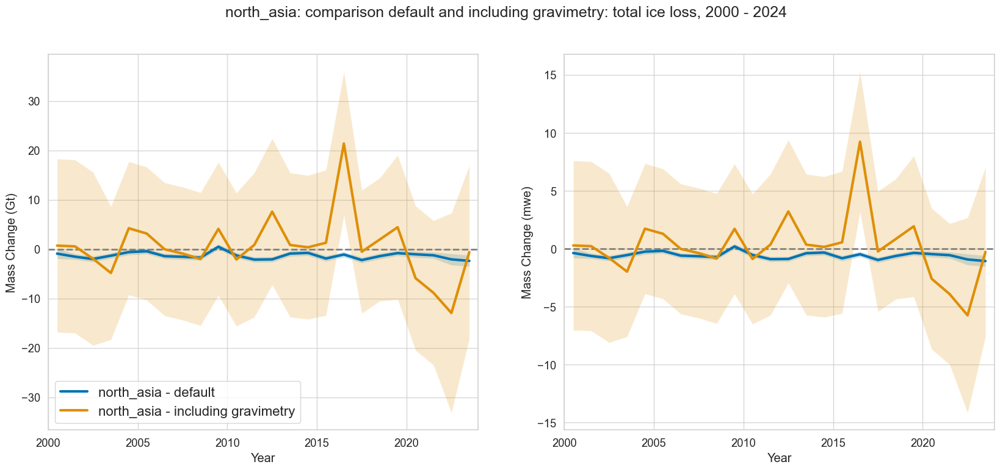

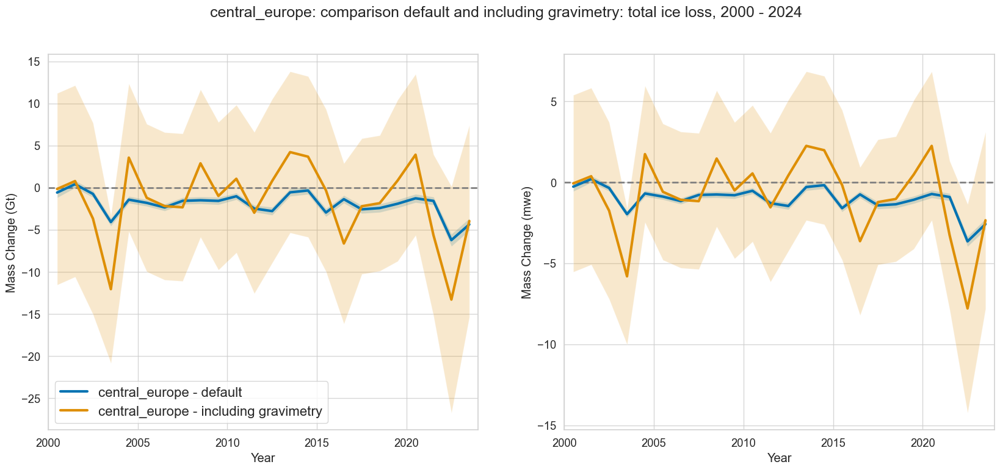

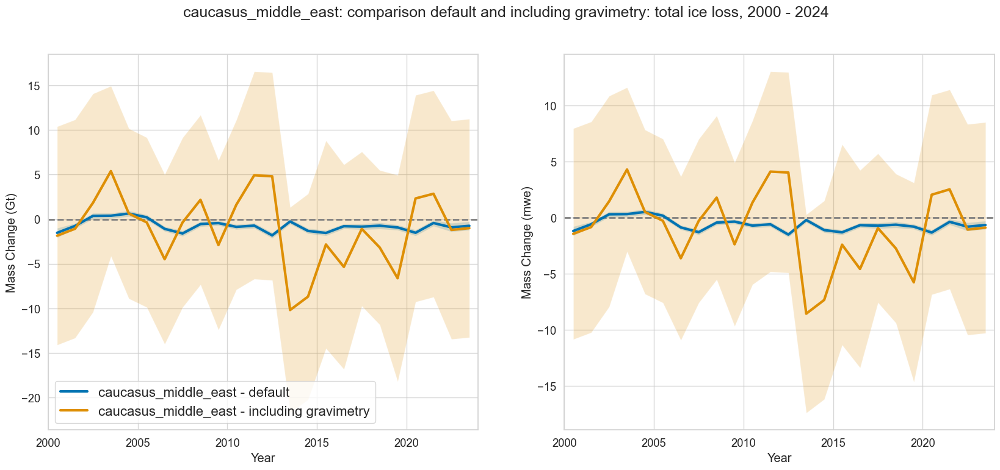

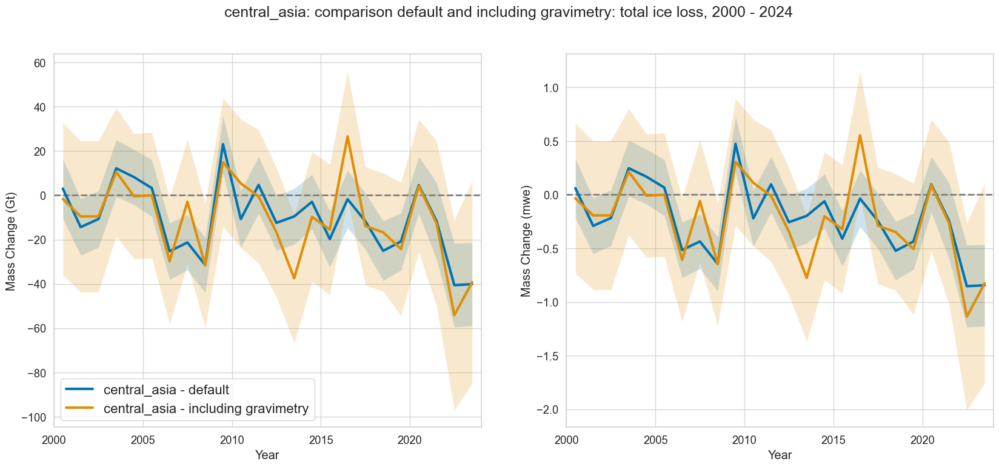

...

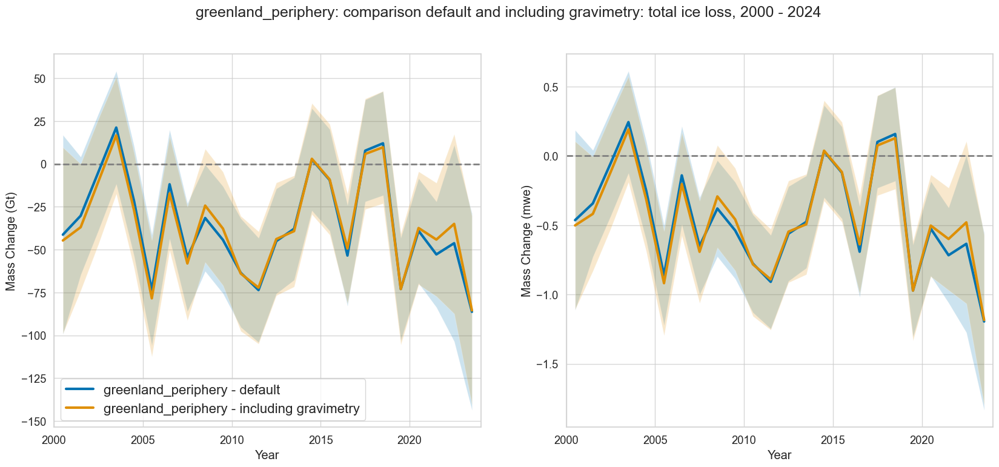

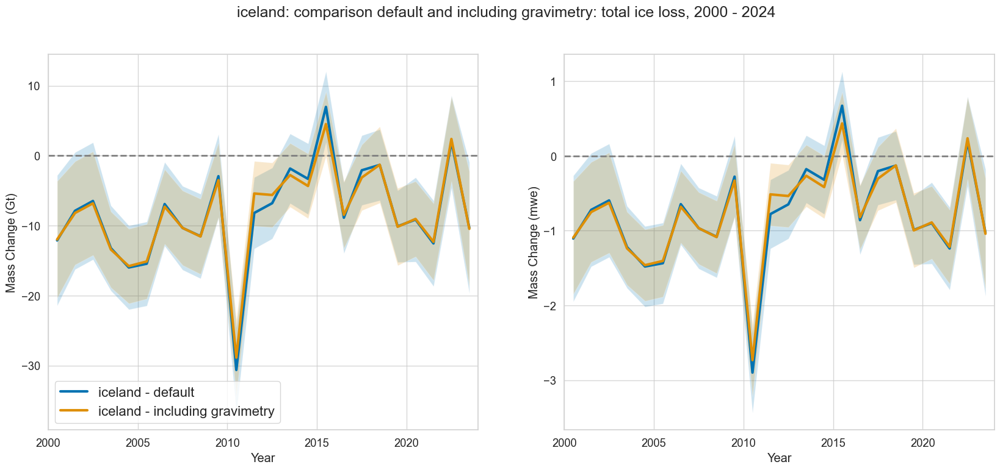

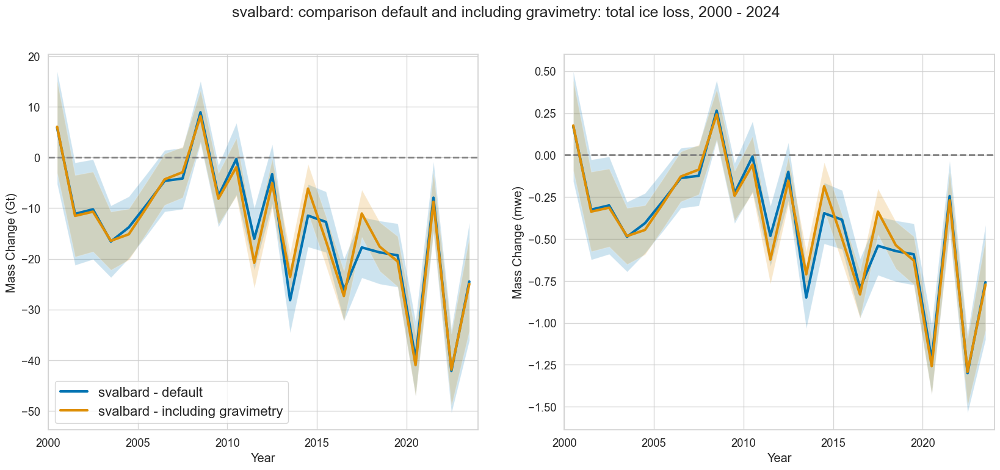

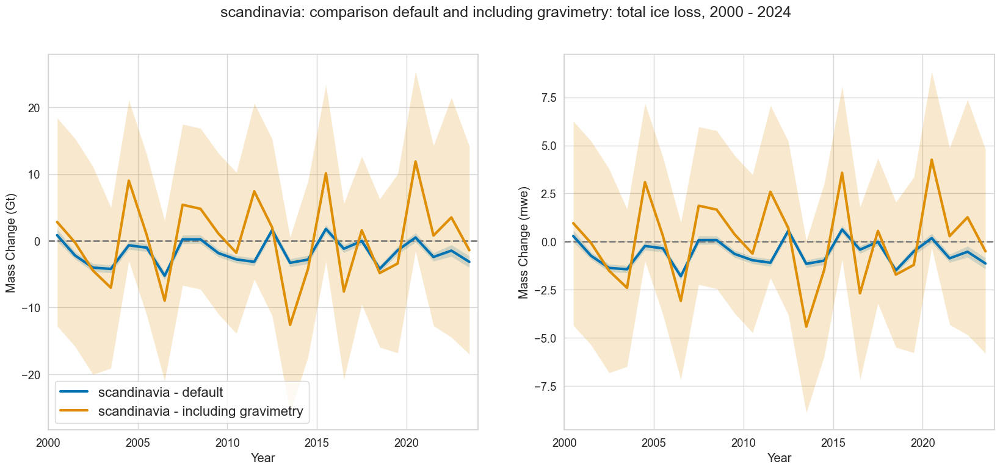

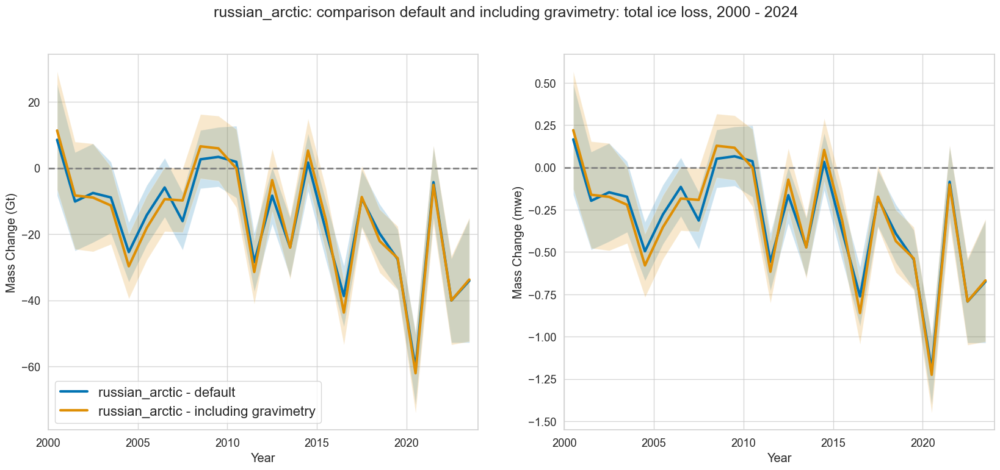

In [52]:
for i in range(0,len(list_of_folders)):
    #define region name and path to results
    region = list_of_folders[i]
    
    #get the region name without  the number
    region_name = region[region.find("_")+1:-4]

    #read in the data
    region_normal_df = pd.read_csv(os.path.join(d_dir_normal, region)).drop('Unnamed: 0', axis=1)
    region_comparison_df = pd.read_csv(os.path.join(d_dir_2023, region)).drop('Unnamed: 0', axis=1)

    #plot
    two_runs_comparison_plot(region_name, 'default', 'including gravimetry', region_normal_df, region_comparison_df)

### cumulative changes in GT and area

In [ ]:
for i in range(0,len(list_of_folders)):
    #define region name and path to results
    region = list_of_folders[i]
    
    #get the region name without  the number
    region_name = region[region.find("_")+1:-4]

    #read in the data
    region_normal = pd.read_csv(os.path.join(d_dir_normal, region)).drop('Unnamed: 0', axis=1)
    region_2012 = pd.read_csv(os.path.join(d_dir_2012, region)).drop('Unnamed: 0', axis=1)

    #calculate cumulative for normal
    cum_region_gt_6 = derivative_to_cumulative(region_normal.start_dates, region_normal.end_dates, region_normal.combined_gt)
    cum_region_gt_err_6 = derivative_to_cumulative(region_normal.start_dates, region_normal.end_dates, region_normal.combined_gt_errors, calculate_as_errors=True)

    cum_region_mwe_6 = derivative_to_cumulative(region_normal.start_dates, region_normal.end_dates, region_normal.combined_mwe)
    cum_region_mwe_err_6 = derivative_to_cumulative(region_normal.start_dates, region_normal.end_dates, region_normal.combined_mwe_errors, calculate_as_errors=True)

    #calculate cumulative for 2012
    cum_region_gt_7 = derivative_to_cumulative(region_2012.start_dates, region_2012.end_dates, region_2012.combined_gt)
    cum_region_gt_err_7 = derivative_to_cumulative(region_2012.start_dates, region_2012.end_dates, region_2012.combined_gt_errors, calculate_as_errors=True)

    cum_region_mwe_7 = derivative_to_cumulative(region_2012.start_dates, region_2012.end_dates, region_2012.combined_mwe)
    cum_region_mwe_err_7 = derivative_to_cumulative(region_2012.start_dates, region_2012.end_dates, region_2012.combined_mwe_errors, calculate_as_errors=True)

    #plot
    two_runs_cumulative_comparison_plot(region_name, 'default datasets', 'including gravimetry', cum_region_gt_6, cum_region_gt_err_6, cum_region_gt_7,
                           cum_region_gt_err_7, cum_region_mwe_6, cum_region_mwe_err_6,
                           cum_region_mwe_7, cum_region_mwe_err_7)

    #save to folder
    #plt.savefig('C:/Users/Milva/Documents/Uni Freiburg/Semester 2.1/capstone/RGI6 vs 7 plots/' + region_name + '_comparison.png')

In [ ]:
for i in range(0,len(list_of_folders)):
    #define region name and path to results
    region = list_of_folders[i]
    
    #get the region name without  the number
    region_name = region[region.find("_")+1:-4]

    #read in the data
    region_normal = pd.read_csv(os.path.join(d_dir_normal, region)).drop('Unnamed: 0', axis=1)
    region_2023 = pd.read_csv(os.path.join(d_dir_2023, region)).drop('Unnamed: 0', axis=1)

    #calculate cumulative for normal
    cum_region_gt_6 = derivative_to_cumulative(region_normal.start_dates, region_normal.end_dates, region_normal.combined_gt)
    cum_region_gt_err_6 = derivative_to_cumulative(region_normal.start_dates, region_normal.end_dates, region_normal.combined_gt_errors, calculate_as_errors=True)

    cum_region_mwe_6 = derivative_to_cumulative(region_normal.start_dates, region_normal.end_dates, region_normal.combined_mwe)
    cum_region_mwe_err_6 = derivative_to_cumulative(region_normal.start_dates, region_normal.end_dates, region_normal.combined_mwe_errors, calculate_as_errors=True)

    #calculate cumulative for 2012
    cum_region_gt_7 = derivative_to_cumulative(region_2023.start_dates, region_2023.end_dates, region_2023.combined_gt)
    cum_region_gt_err_7 = derivative_to_cumulative(region_2023.start_dates, region_2023.end_dates, region_2023.combined_gt_errors, calculate_as_errors=True)

    cum_region_mwe_7 = derivative_to_cumulative(region_2023.start_dates, region_2023.end_dates, region_2023.combined_mwe)
    cum_region_mwe_err_7 = derivative_to_cumulative(region_2023.start_dates, region_2023.end_dates, region_2023.combined_mwe_errors, calculate_as_errors=True)

    #plot
    two_runs_cumulative_comparison_plot(region_name, 'normal', '2023', cum_region_gt_6, cum_region_gt_err_6, cum_region_gt_7,
                           cum_region_gt_err_7, cum_region_mwe_6, cum_region_mwe_err_6,
                           cum_region_mwe_7, cum_region_mwe_err_7)

### difference between runs

In [ ]:
for i in range(0,len(list_of_folders)):
    #define region name and path to results
    region = list_of_folders[i]
    
    #get the region name without  the number
    region_name = region[region.find("_")+1:-4]

    #read in the data
    region_normal_df = pd.read_csv(os.path.join(d_dir_normal, region)).drop('Unnamed: 0', axis=1)
    region_comparison_df = pd.read_csv(os.path.join(d_dir_2012, region)).drop('Unnamed: 0', axis=1)

    #plot
    two_runs_difference_plot(region_name, 'Normal', '2012', difference_between_runs_plot(region_normal_df, region_comparison_df))

In [ ]:
for i in range(0,len(list_of_folders)):
    #define region name and path to results
    region = list_of_folders[i]
    
    #get the region name without  the number
    region_name = region[region.find("_")+1:-4]

    #read in the data
    region_normal_df = pd.read_csv(os.path.join(d_dir_normal, region)).drop('Unnamed: 0', axis=1)
    region_comparison_df = pd.read_csv(os.path.join(d_dir_2023, region)).drop('Unnamed: 0', axis=1)

    #plot
    two_runs_difference_plot(region_name, 'Normal', '2023', difference_between_runs_plot(region_normal_df, region_comparison_df))

### GT: relative & absolute change and correlation barplot

In [ ]:
#for 2012
region_labels = []

rel_2012_gt = []
abs_2012_gt = []
corr_2012_gt = []

rel_2012_mwe = []
abs_2012_mwe = []
corr_2012_mwe = []

rel_2023_gt = []
abs_2023_gt = []
corr_2023_gt = []

rel_2023_mwe = []
abs_2023_mwe = []
corr_2023_mwe = []

for i in range(0,len(list_of_folders)):
    #define region name and path to results
    region = list_of_folders[i]
    
    #get the region name without  the number
    region_name = region[region.find("_")+1:-4]

    #load in the data
    region_normal_df = pd.read_csv(os.path.join(d_dir_normal, region)).drop('Unnamed: 0', axis=1)
    region_2012_df = pd.read_csv(os.path.join(d_dir_2012, region)).drop('Unnamed: 0', axis=1)
    region_2023_df = pd.read_csv(os.path.join(d_dir_2023, region)).drop('Unnamed: 0', axis=1)

    #store region label
    region_labels.append(region_name)

    #compute metrics & store values gt 2012
    rel_diff_val_2012_gt, abs_diff_val_2012_gt, corr_val_2012_gt = compute_all_metrics_gt(region_normal_df, region_2012_df)
    
    rel_2012_gt.append(rel_diff_val_2012_gt)
    abs_2012_gt.append(abs_diff_val_2012_gt)
    corr_2012_gt.append(corr_val_2012_gt)

    #compute metrics & store values mwe 2012
    rel_diff_val_2012_mwe, abs_diff_val_2012_mwe, corr_val_2012_mwe = compute_all_metrics_mwe(region_normal_df, region_2012_df)
    
    rel_2012_mwe.append(rel_diff_val_2012_mwe)
    abs_2012_mwe.append(abs_diff_val_2012_mwe)
    corr_2012_mwe.append(corr_val_2012_mwe)

    #compute metrics & store values gt 2023
    rel_diff_val_2023_gt, abs_diff_val_2023_gt, corr_val_2023_gt = compute_all_metrics_gt(region_normal_df, region_2023_df)
    
    rel_2023_gt.append(rel_diff_val_2023_gt)
    abs_2023_gt.append(abs_diff_val_2023_gt)
    corr_2023_gt.append(corr_val_2023_gt)

    #compute metrics & store values mwe 2023
    rel_diff_val_2023_mwe, abs_diff_val_2023_mwe, corr_val_2023_mwe = compute_all_metrics_mwe(region_normal_df, region_2023_df)
    
    rel_2023_mwe.append(rel_diff_val_2023_mwe)
    abs_2023_mwe.append(abs_diff_val_2023_mwe)
    corr_2023_mwe.append(corr_val_2023_mwe)

In [ ]:
#plot for gt 2012
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(16, max(6, len(region_labels) * 0.6)), sharey=True)

n = len(region_labels)
y_pos = np.arange(n)

# Panel 1: Global relative difference (%)
ax1.barh(y_pos, rel_2012_gt)
ax1.set_yticks(y_pos)
ax1.set_yticklabels(region_labels, fontsize=9)
ax1.invert_yaxis()
ax1.set_xlabel("Relative Change (%)")
ax1.axvline(0, color="black", linewidth=0.8)
max_abs_rel = max(abs(v) for v in rel_2012_gt) or 1
for i, val in enumerate(rel_2012_gt):
    if val >= 0:
        ax1.text(val + 0.02 * max_abs_rel, i, f"+{val:.3f}%", va="center", fontsize=8)
    else:
        ax1.text(val - 0.02 * max_abs_rel, i, f"{val:.3f}%", va="center", ha="right", fontsize=8)
pad = max_abs_rel * 0.20
ax1.set_xlim(min(rel_2012_gt) - pad, max(rel_2012_gt) + pad)

# Panel 2: Global absolute difference (Gt)
ax2.barh(y_pos, abs_2012_gt)
ax2.set_xlabel("Absolute Difference (Gt)")
ax2.axvline(0, color="black", linewidth=0.8)
max_abs_diff = max(abs(v) for v in abs_2012_gt) or 1
for i, val in enumerate(abs_2012_gt):
    if val >= 0:
        ax2.text(val + 0.02 * max_abs_diff, i, f"+{val:.3f}", va="center", fontsize=8)
    else:
        ax2.text(val - 0.02 * max_abs_diff, i, f"{val:.3f}", va="center", ha="right", fontsize=8)
pad = max_abs_diff * 0.30
ax2.set_xlim(min(abs_2012_gt) - pad, max(abs_2012_gt) + pad)
# Panel 3: Global correlation
ax3.barh(y_pos, corr_2012_gt)
ax3.set_xlabel("Correlation")
ax3.set_xlim(-0.1, 1.2)
for i, val in enumerate(corr_2012_gt):
    if val >= 0:
        ax3.text(val + 0.02, i, f"{val:.3f}", va="center", fontsize=8)
    else:
        ax3.text(val + 0.08, i, f"{val:.3f}", va="center", ha="right", fontsize=8)

fig.suptitle(f"metrics 2012 vs reference_run for each region", fontsize=12)
fig.tight_layout()
fig.set_dpi(300)
plt.show()

In [ ]:
#plot for gt 2023
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(16, max(6, len(region_labels) * 0.6)), sharey=True)

n = len(region_labels)
y_pos = np.arange(n)

# Panel 1: Global relative difference (%)
ax1.barh(y_pos, rel_2023_gt)
ax1.set_yticks(y_pos)
ax1.set_yticklabels(region_labels, fontsize=9)
ax1.invert_yaxis()
ax1.set_xlabel("Relative Change (%)")
ax1.axvline(0, color="black", linewidth=0.8)
max_abs_rel = max(abs(v) for v in rel_2023_gt) or 1
for i, val in enumerate(rel_2023_gt):
    if val >= 0:
        ax1.text(val + 0.02 * max_abs_rel, i, f"+{val:.3f}%", va="center", fontsize=8)
    else:
        ax1.text(val - 0.02 * max_abs_rel, i, f"{val:.3f}%", va="center", ha="right", fontsize=8)
pad = max_abs_rel * 0.20
ax1.set_xlim(min(rel_2023_gt) - pad, max(rel_2023_gt) + pad)

# Panel 2: Global absolute difference (Gt)
ax2.barh(y_pos, abs_2023_gt)
ax2.set_xlabel("Absolute Difference (Gt)")
ax2.axvline(0, color="black", linewidth=0.8)
max_abs_diff = max(abs(v) for v in abs_2023_gt) or 1
for i, val in enumerate(abs_2023_gt):
    if val >= 0:
        ax2.text(val + 0.02 * max_abs_diff, i, f"+{val:.3f}", va="center", fontsize=8)
    else:
        ax2.text(val - 0.02 * max_abs_diff, i, f"{val:.3f}", va="center", ha="right", fontsize=8)
pad = max_abs_diff * 0.30
ax2.set_xlim(min(abs_2023_gt) - pad, max(abs_2023_gt) + pad)
# Panel 3: Global correlation
ax3.barh(y_pos, corr_2023_gt)
ax3.set_xlabel("Correlation")
ax3.set_xlim(-0.1, 1.2)
for i, val in enumerate(corr_2023_gt):
    if val >= 0:
        ax3.text(val + 0.02, i, f"{val:.3f}", va="center", fontsize=8)
    else:
        ax3.text(val + 0.08, i, f"{val:.3f}", va="center", ha="right", fontsize=8)

fig.suptitle(f"metrics 2023 vs reference_run for each region", fontsize=12)
fig.tight_layout()
fig.set_dpi(300)
plt.show()

### MWE: relative & absolute change and correlation barplot

In [ ]:
#plot for mwe 2012
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(16, max(6, len(region_labels) * 0.6)), sharey=True)

n = len(region_labels)
y_pos = np.arange(n)

# Panel 1: Global relative difference (%)
ax1.barh(y_pos, rel_2012_mwe)
ax1.set_yticks(y_pos)
ax1.set_yticklabels(region_labels, fontsize=9)
ax1.invert_yaxis()
ax1.set_xlabel("Relative Change (%)")
ax1.axvline(0, color="black", linewidth=0.8)
max_abs_rel = max(abs(v) for v in rel_2012_mwe) or 1
for i, val in enumerate(rel_2012_mwe):
    if val >= 0:
        ax1.text(val + 0.02 * max_abs_rel, i, f"+{val:.3f}%", va="center", fontsize=8)
    else:
        ax1.text(val - 0.02 * max_abs_rel, i, f"{val:.3f}%", va="center", ha="right", fontsize=8)
pad = max_abs_rel * 0.20
ax1.set_xlim(min(rel_2012_mwe) - pad, max(rel_2012_mwe) + pad)

# Panel 2: Global absolute difference (mwe)
ax2.barh(y_pos, abs_2012_mwe)
ax2.set_xlabel("Absolute Difference (mwe)")
ax2.axvline(0, color="black", linewidth=0.8)
max_abs_diff = max(abs(v) for v in abs_2012_mwe) or 1
for i, val in enumerate(abs_2012_mwe):
    if val >= 0:
        ax2.text(val + 0.02 * max_abs_diff, i, f"+{val:.3f}", va="center", fontsize=8)
    else:
        ax2.text(val - 0.02 * max_abs_diff, i, f"{val:.3f}", va="center", ha="right", fontsize=8)
pad = max_abs_diff * 0.30
ax2.set_xlim(min(abs_2012_mwe) - pad, max(abs_2012_mwe) + pad)
# Panel 3: Global correlation
ax3.barh(y_pos, corr_2012_mwe)
ax3.set_xlabel("Correlation")
ax3.set_xlim(-0.1, 1.2)
for i, val in enumerate(corr_2012_mwe):
    if val >= 0:
        ax3.text(val + 0.02, i, f"{val:.3f}", va="center", fontsize=8)
    else:
        ax3.text(val + 0.08, i, f"{val:.3f}", va="center", ha="right", fontsize=8)

fig.suptitle(f"metrics 2012 vs reference_run for each region", fontsize=12)
fig.tight_layout()
fig.set_dpi(300)
plt.show()

In [ ]:
#plot for mwe 2023
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(16, max(6, len(region_labels) * 0.6)), sharey=True)

n = len(region_labels)
y_pos = np.arange(n)

# Panel 1: Global relative difference (%)
ax1.barh(y_pos, rel_2023_mwe)
ax1.set_yticks(y_pos)
ax1.set_yticklabels(region_labels, fontsize=9)
ax1.invert_yaxis()
ax1.set_xlabel("Relative Change (%)")
ax1.axvline(0, color="black", linewidth=0.8)
max_abs_rel = max(abs(v) for v in rel_2023_mwe) or 1
for i, val in enumerate(rel_2023_mwe):
    if val >= 0:
        ax1.text(val + 0.02 * max_abs_rel, i, f"+{val:.3f}%", va="center", fontsize=8)
    else:
        ax1.text(val - 0.02 * max_abs_rel, i, f"{val:.3f}%", va="center", ha="right", fontsize=8)
pad = max_abs_rel * 0.20
ax1.set_xlim(min(rel_2023_mwe) - pad, max(rel_2023_mwe) + pad)

# Panel 2: Global absolute difference (mwe)
ax2.barh(y_pos, abs_2023_mwe)
ax2.set_xlabel("Absolute Difference (mwe)")
ax2.axvline(0, color="black", linewidth=0.8)
max_abs_diff = max(abs(v) for v in abs_2023_mwe) or 1
for i, val in enumerate(abs_2023_mwe):
    if val >= 0:
        ax2.text(val + 0.02 * max_abs_diff, i, f"+{val:.3f}", va="center", fontsize=8)
    else:
        ax2.text(val - 0.02 * max_abs_diff, i, f"{val:.3f}", va="center", ha="right", fontsize=8)
pad = max_abs_diff * 0.30
ax2.set_xlim(min(abs_2023_mwe) - pad, max(abs_2023_mwe) + pad)
# Panel 3: Global correlation
ax3.barh(y_pos, corr_2023_mwe)
ax3.set_xlabel("Correlation")
ax3.set_xlim(-0.1, 1.2)
for i, val in enumerate(corr_2023_mwe):
    if val >= 0:
        ax3.text(val + 0.02, i, f"{val:.3f}", va="center", fontsize=8)
    else:
        ax3.text(val + 0.08, i, f"{val:.3f}", va="center", ha="right", fontsize=8)

fig.suptitle(f"metrics 2023 vs reference_run for each region", fontsize=12)
fig.tight_layout()
fig.set_dpi(300)
plt.show()

## 3 runs difference

### changes in GT and area

In [ ]:
for i in range(0,len(list_of_folders)):
    #define region name and path to results
    region = list_of_folders[i]
    
    #get the region name without  the number
    region_name = region[region.find("_")+1:-4]

    #read in the data
    region_normal_df = pd.read_csv(os.path.join(d_dir_normal, region)).drop('Unnamed: 0', axis=1)
    region_2012_df = pd.read_csv(os.path.join(d_dir_2012, region)).drop('Unnamed: 0', axis=1)
    region_2023_df = pd.read_csv(os.path.join(d_dir_2023, region)).drop('Unnamed: 0', axis=1)


    #plot
    three_runs_comparison_plot(region_name, 'Normal', '2012', '2023', region_normal_df, region_2012_df, region_2023_df)


### cumulative changes in gt and mwe

In [ ]:

for i in range(0,len(list_of_folders)):
    #define region name and path to results
    region = list_of_folders[i]
    
    #get the region name without  the number
    region_name = region[region.find("_")+1:-4]

    #read in the data
    region_normal = pd.read_csv(os.path.join(d_dir_normal, region)).drop('Unnamed: 0', axis=1)
    region_2012 = pd.read_csv(os.path.join(d_dir_2012, region)).drop('Unnamed: 0', axis=1)
    region_2023 = pd.read_csv(os.path.join(d_dir_2023, region)).drop('Unnamed: 0', axis=1)

    #plot
    three_runs_cumulative_comparison_plot(region_name, 'Reference', '2012', '2023', region_normal, region_2012, region_2023)



### difference between runs

In [ ]:
for i in range(0,len(list_of_folders)):
    
    #define region name and path to results
    region = list_of_folders[i]
    
    #get the region name without  the number
    region_name = region[region.find("_")+1:-4]

    #read in the data
    region_normal_df = pd.read_csv(os.path.join(d_dir_normal, region)).drop('Unnamed: 0', axis=1)
    region_2012_df = pd.read_csv(os.path.join(d_dir_2012, region)).drop('Unnamed: 0', axis=1)
    region_2023_df = pd.read_csv(os.path.join(d_dir_2023, region)).drop('Unnamed: 0', axis=1)

    #calculate difference dfs
    nor_12_diff = difference_between_runs_plot(region_normal_df, region_2012_df)
    nor_23_diff = difference_between_runs_plot(region_normal_df, region_2023_df)

    #plot
    three_runs_difference_plot(region_name, 'Normal - 2012', 'Normal - 2023', nor_12_diff, nor_23_diff)

### difference between runs %

In [ ]:
for i in range(0,len(list_of_folders)):
    #define region name and path to results
    region = list_of_folders[i]
    
    #get the region name without  the number
    region_name = region[region.find("_")+1:-4]

    #load in the data
    region_normal_df = pd.read_csv(os.path.join(d_dir_normal, region)).drop('Unnamed: 0', axis=1)
    region_2012_df = pd.read_csv(os.path.join(d_dir_2012, region)).drop('Unnamed: 0', axis=1)
    region_2023_df = pd.read_csv(os.path.join(d_dir_2023, region)).drop('Unnamed: 0', axis=1)

    #compute metrics & store values 2012
    rel_diff_df_2012 = compute_relative_diff_timeseries(region_normal_df, region_2012_df)
    rel_diff_df_2023 = compute_relative_diff_timeseries(region_normal_df, region_2023_df)

    #plot
    three_runs_relative_difference_plot(region_name, 'Reference - 2012', 'Reference - 2023', rel_diff_df_2012, rel_diff_df_2023)


In [ ]:
for i in range(0,len(list_of_folders)):
    
    #define region name and path to results
    region = list_of_folders[i]
    
    #get the region name without  the number
    region_name = region[region.find("_")+1:-4]

    #read in the data
    region_normal_df = pd.read_csv(os.path.join(d_dir_normal, region)).drop('Unnamed: 0', axis=1)
    region_2012_df = pd.read_csv(os.path.join(d_dir_2012, region)).drop('Unnamed: 0', axis=1)
    region_2023_df = pd.read_csv(os.path.join(d_dir_2023, region)).drop('Unnamed: 0', axis=1)

    #calculate difference dfs
    nor_12_diff = difference_between_runs_plot(region_normal_df, region_2012_df)
    nor_23_diff = difference_between_runs_plot(region_normal_df, region_2023_df)

    #plot
    three_runs_difference_plot(region_name, 'Normal - 2012', 'Normal - 2023', nor_12_diff, nor_23_diff)

### GT: relative & absolute change and correlation barplot

In [ ]:
#for 2012
region_labels = []

rel_2012_gt = []
abs_2012_gt = []
corr_2012_gt = []

rel_2012_mwe = []
abs_2012_mwe = []
corr_2012_mwe = []

rel_2023_gt = []
abs_2023_gt = []
corr_2023_gt = []

rel_2023_mwe = []
abs_2023_mwe = []
corr_2023_mwe = []

for i in range(0,len(list_of_folders)):
    #define region name and path to results
    region = list_of_folders[i]
    
    #get the region name without  the number
    region_name = region[region.find("_")+1:-4]

    #load in the data
    region_normal_df = pd.read_csv(os.path.join(d_dir_normal, region)).drop('Unnamed: 0', axis=1)
    region_2012_df = pd.read_csv(os.path.join(d_dir_2012, region)).drop('Unnamed: 0', axis=1)
    region_2023_df = pd.read_csv(os.path.join(d_dir_2023, region)).drop('Unnamed: 0', axis=1)

    #store region label
    region_labels.append(region_name)

    #compute metrics & store values gt 2012
    rel_diff_val_2012_gt, abs_diff_val_2012_gt, corr_val_2012_gt = compute_all_metrics_gt(region_normal_df, region_2012_df)
    
    rel_2012_gt.append(rel_diff_val_2012_gt)
    abs_2012_gt.append(abs_diff_val_2012_gt)
    corr_2012_gt.append(corr_val_2012_gt)

    #compute metrics & store values mwe 2012
    rel_diff_val_2012_mwe, abs_diff_val_2012_mwe, corr_val_2012_mwe = compute_all_metrics_mwe(region_normal_df, region_2012_df)
    
    rel_2012_mwe.append(rel_diff_val_2012_mwe)
    abs_2012_mwe.append(abs_diff_val_2012_mwe)
    corr_2012_mwe.append(corr_val_2012_mwe)

    #compute metrics & store values gt 2023
    rel_diff_val_2023_gt, abs_diff_val_2023_gt, corr_val_2023_gt = compute_all_metrics_gt(region_normal_df, region_2023_df)
    
    rel_2023_gt.append(rel_diff_val_2023_gt)
    abs_2023_gt.append(abs_diff_val_2023_gt)
    corr_2023_gt.append(corr_val_2023_gt)

    #compute metrics & store values mwe 2023
    rel_diff_val_2023_mwe, abs_diff_val_2023_mwe, corr_val_2023_mwe = compute_all_metrics_mwe(region_normal_df, region_2023_df)
    
    rel_2023_mwe.append(rel_diff_val_2023_mwe)
    abs_2023_mwe.append(abs_diff_val_2023_mwe)
    corr_2023_mwe.append(corr_val_2023_mwe)

In [ ]:
#plot for gt
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(16, max(6, len(region_labels) * 0.6)), sharey=True)

n = len(region_labels)
y_pos = np.arange(n)

w= 0.4

################
# Panel 1: Global relative difference (%)
ax1.barh(y_pos - w/2, rel_2012_gt, height=w, label='2012')
ax1.barh(y_pos + w/2, rel_2023_gt, height=w, label='2023')

ax1.set_yticks(y_pos)
ax1.set_yticklabels(region_labels, fontsize=9)
ax1.invert_yaxis()
ax1.set_xlabel("Relative Change (%)")
ax1.axvline(0, color="black", linewidth=0.8)

#text 2012
max_abs_rel_2012 = max(abs(v) for v in rel_2012_gt) or 1
for i, val in enumerate(rel_2012_gt):
    if val >= 0:
        ax1.text(val + 0.02 * max_abs_rel_2012, i - w/2, f"+{val:.2f}%", va="center", fontsize=8)
    else:
        ax1.text(val - 0.02 * max_abs_rel_2012, i - w/2, f"{val:.2f}%", va="center", ha="right", fontsize=8)

#text 2023
max_abs_rel_2023 = max(abs(v) for v in rel_2023_gt) or 1
for i, val in enumerate(rel_2023_gt):
    if val >= 0:
        ax1.text(val + 0.02 * max_abs_rel_2023, i + w/2, f"+{val:.2f}%", va="center", fontsize=8 )
    else:
        ax1.text(val - 0.02 * max_abs_rel_2023, i + w/2, f"{val:.2f}%", va="center", ha="right", fontsize=8)
        
pad = max(max_abs_rel_2012, max_abs_rel_2023)* 0.20
ax1.set_xlim(min(rel_2012_gt + rel_2023_gt) - pad, max(rel_2012_gt + rel_2023_gt) + pad)

###########
# Panel 2: Global absolute difference (Gt)
ax2.barh(y_pos - w/2, abs_2012_gt, height=w, label='2012')
ax2.barh(y_pos + w/2, abs_2023_gt, height=w, label='2023')

ax2.set_xlabel("Absolute Difference (Gt)")
ax2.axvline(0, color="black", linewidth=0.8)

#text 2012
max_abs_diff_2012 = max(abs(v) for v in abs_2012_gt) or 1
for i, val in enumerate(abs_2012_gt):
    if val >= 0:
        ax2.text(val + 0.02 * max_abs_diff_2012, i- w/2, f"+{val:.2f}", va="center", fontsize=8)
    else:
        ax2.text(val - 0.02 * max_abs_diff_2012, i- w/2, f"{val:.2f}", va="center", ha="right", fontsize=8)

#text 2023
max_abs_diff_2023 = max(abs(v) for v in abs_2023_gt) or 1
for i, val in enumerate(abs_2023_gt):
    if val >= 0:
        ax2.text(val + 0.02 * max_abs_diff_2023, i+ w/2, f"+{val:.2f}", va="center", fontsize=8)
    else:
        ax2.text(val - 0.02 * max_abs_diff_2023, i+ w/2, f"{val:.2f}", va="center", ha="right", fontsize=8)

pad = max(max_abs_diff_2012, max_abs_diff_2023)* 0.30
ax2.set_xlim(min(abs_2012_gt + abs_2023_gt) - pad, max(abs_2012_gt + abs_2023_gt) + pad)


###########3
# Panel 3: Global correlation
ax3.barh(y_pos - w/2, corr_2012_gt, height=w, label='2012')
ax3.barh(y_pos + w/2, corr_2023_gt, height=w, label='2023')

ax3.set_xlabel("Correlation")
ax3.set_xlim(-0.1, 1.2)

#text 2012
for i, val in enumerate(corr_2012_gt):
    if val >= 0:
        ax3.text(val + 0.02, i - w/2, f"{val:.2f}", va="center", fontsize=8)
    else:
        ax3.text(val + 0.08, i- w/2, f"{val:.2f}", va="center", ha="right", fontsize=8)

#text 2023
for i, val in enumerate(corr_2023_gt):
    if val >= 0:
        ax3.text(val + 0.02, i + w/2, f"{val:.2f}", va="center", fontsize=8)
    else:
        ax3.text(val + 0.08, i + w/2, f"{val:.2f}", va="center", ha="right", fontsize=8)

fig.suptitle(f"Gigaton Metrics 2012 & 2023 vs Reference for each Region", fontsize=12)
fig.tight_layout()
fig.set_dpi(300)
ax1.legend()
#plt.show()

#save to folder
plt.savefig('C:/Users/Milva/Documents/Uni Freiburg/Semester 2.1/capstone/area non static plots/gigaton_metrics_barplot.png')

### mwe: relative & absolute change and correlation barplot

In [ ]:
#plot for mwe
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(16, max(6, len(region_labels) * 0.6)), sharey=True)

n = len(region_labels)
y_pos = np.arange(n)

w= 0.4

################
# Panel 1: Global relative difference (%)
ax1.barh(y_pos - w/2, rel_2012_mwe, height=w, label='2012')
ax1.barh(y_pos + w/2, rel_2023_mwe, height=w, label='2023')

ax1.set_yticks(y_pos)
ax1.set_yticklabels(region_labels, fontsize=9)
ax1.invert_yaxis()
ax1.set_xlabel("Relative Change (%)")
ax1.axvline(0, color="black", linewidth=0.8)

#text 2012
max_abs_rel_2012 = max(abs(v) for v in rel_2012_mwe) or 1
for i, val in enumerate(rel_2012_mwe):
    if val >= 0:
        ax1.text(val + 0.02 * max_abs_rel_2012, i - w/2, f"+{val:.2f}%", va="center", fontsize=8)
    else:
        ax1.text(val - 0.02 * max_abs_rel_2012, i - w/2, f"{val:.2f}%", va="center", ha="right", fontsize=8)

#text 2023
max_abs_rel_2023 = max(abs(v) for v in rel_2023_mwe) or 1
for i, val in enumerate(rel_2023_mwe):
    if val >= 0:
        ax1.text(val + 0.02 * max_abs_rel_2023, i + w/2, f"+{val:.2f}%", va="center", fontsize=8 )
    else:
        ax1.text(val - 0.02 * max_abs_rel_2023, i + w/2, f"{val:.2f}%", va="center", ha="right", fontsize=8)
        
pad = max(max_abs_rel_2012, max_abs_rel_2023)* 0.20
ax1.set_xlim(min(rel_2012_mwe + rel_2023_mwe) - pad, max(rel_2012_mwe + rel_2023_mwe) + pad)

###########
# Panel 2: Global absolute difference (mwe)
ax2.barh(y_pos - w/2, abs_2012_mwe, height=w, label='2012')
ax2.barh(y_pos + w/2, abs_2023_mwe, height=w, label='2023')

ax2.set_xlabel("Absolute Difference (mwe)")
ax2.axvline(0, color="black", linewidth=0.8)

#text 2012
max_abs_diff_2012 = max(abs(v) for v in abs_2012_mwe) or 1
for i, val in enumerate(abs_2012_mwe):
    if val >= 0:
        ax2.text(val + 0.02 * max_abs_diff_2012, i- w/2, f"+{val:.2f}", va="center", fontsize=8)
    else:
        ax2.text(val - 0.02 * max_abs_diff_2012, i- w/2, f"{val:.2f}", va="center", ha="right", fontsize=8)

#text 2023
max_abs_diff_2023 = max(abs(v) for v in abs_2023_mwe) or 1
for i, val in enumerate(abs_2023_mwe):
    if val >= 0:
        ax2.text(val + 0.02 * max_abs_diff_2023, i+ w/2, f"+{val:.2f}", va="center", fontsize=8)
    else:
        ax2.text(val - 0.02 * max_abs_diff_2023, i+ w/2, f"{val:.2f}", va="center", ha="right", fontsize=8)

pad = max(max_abs_diff_2012, max_abs_diff_2023)* 0.30
ax2.set_xlim(min(abs_2012_mwe + abs_2023_mwe) - pad, max(abs_2012_mwe + abs_2023_mwe) + pad)


###########3
# Panel 3: Global correlation
ax3.barh(y_pos - w/2, corr_2012_mwe, height=w, label='2012')
ax3.barh(y_pos + w/2, corr_2023_mwe, height=w, label='2023')

ax3.set_xlabel("Correlation")
ax3.set_xlim(-0.1, 1.2)

#text 2012
for i, val in enumerate(corr_2012_mwe):
    if val >= 0:
        ax3.text(val + 0.02, i - w/2, f"{val:.2f}", va="center", fontsize=8)
    else:
        ax3.text(val + 0.08, i- w/2, f"{val:.2f}", va="center", ha="right", fontsize=8)

#text 2023
for i, val in enumerate(corr_2023_mwe):
    if val >= 0:
        ax3.text(val + 0.02, i + w/2, f"{val:.2f}", va="center", fontsize=8)
    else:
        ax3.text(val + 0.08, i + w/2, f"{val:.2f}", va="center", ha="right", fontsize=8)

fig.suptitle(f"MWE Metrics 2012 & 2023 vs Reference for each Region", fontsize=12)
fig.tight_layout()
fig.set_dpi(300)
ax1.legend()
#plt.show()

plt.savefig('C:/Users/Milva/Documents/Uni Freiburg/Semester 2.1/capstone/area non static plots/mwe_metrics_barplot.png')

### without correlation

In [ ]:
#plot for gt
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, max(6, len(region_labels) * 0.6)), sharey=True)

n = len(region_labels)
y_pos = np.arange(n)

w= 0.4

################
# Panel 1: Global relative difference (%)
ax1.barh(y_pos - w/2, rel_2012_gt, height=w, label='2012')
ax1.barh(y_pos + w/2, rel_2023_gt, height=w, label='2023')

ax1.set_yticks(y_pos)
ax1.set_yticklabels(region_labels, fontsize=12)
ax1.invert_yaxis()
ax1.set_xlabel("Relative Change (%)")
ax1.axvline(0, color="black", linewidth=0.8)

#text 2012
max_abs_rel_2012 = max(abs(v) for v in rel_2012_gt) or 1
for i, val in enumerate(rel_2012_gt):
    if val >= 0:
        ax1.text(val + 0.02 * max_abs_rel_2012, i - w/2, f"+{val:.2f}%", va="center", fontsize=8)
    else:
        ax1.text(val - 0.02 * max_abs_rel_2012, i - w/2, f"{val:.2f}%", va="center", ha="right", fontsize=8)

#text 2023
max_abs_rel_2023 = max(abs(v) for v in rel_2023_gt) or 1
for i, val in enumerate(rel_2023_gt):
    if val >= 0:
        ax1.text(val + 0.02 * max_abs_rel_2023, i + w/2, f"+{val:.2f}%", va="center", fontsize=8 )
    else:
        ax1.text(val - 0.02 * max_abs_rel_2023, i + w/2, f"{val:.2f}%", va="center", ha="right", fontsize=8)
        
pad = max(max_abs_rel_2012, max_abs_rel_2023)* 0.20
ax1.set_xlim(min(rel_2012_gt + rel_2023_gt) - pad, max(rel_2012_gt + rel_2023_gt) + pad)

###########
# Panel 2: Global absolute difference (Gt)
ax2.barh(y_pos - w/2, abs_2012_gt, height=w, label='2012')
ax2.barh(y_pos + w/2, abs_2023_gt, height=w, label='2023')

ax2.set_xlabel("Absolute Difference (Gt)")
ax2.axvline(0, color="black", linewidth=0.8)

#text 2012
max_abs_diff_2012 = max(abs(v) for v in abs_2012_gt) or 1
for i, val in enumerate(abs_2012_gt):
    if val >= 0:
        ax2.text(val + 0.02 * max_abs_diff_2012, i- w/2, f"+{val:.2f}", va="center", fontsize=8)
    else:
        ax2.text(val - 0.02 * max_abs_diff_2012, i- w/2, f"{val:.2f}", va="center", ha="right", fontsize=8)

#text 2023
max_abs_diff_2023 = max(abs(v) for v in abs_2023_gt) or 1
for i, val in enumerate(abs_2023_gt):
    if val >= 0:
        ax2.text(val + 0.02 * max_abs_diff_2023, i+ w/2, f"+{val:.2f}", va="center", fontsize=8)
    else:
        ax2.text(val - 0.02 * max_abs_diff_2023, i+ w/2, f"{val:.2f}", va="center", ha="right", fontsize=8)

pad = max(max_abs_diff_2012, max_abs_diff_2023)* 0.30
ax2.set_xlim(min(abs_2012_gt + abs_2023_gt) - pad, max(abs_2012_gt + abs_2023_gt) + pad)



fig.suptitle(f"Gigaton Metrics 2012 & 2023 vs Reference for each Region", fontsize=15)
fig.tight_layout()
fig.set_dpi(300)
ax1.legend()
#plt.show()

#save to folder
plt.savefig('C:/Users/Milva/Documents/Uni Freiburg/Semester 2.1/capstone/area non static plots/gigaton_metrics_barplot_nocorr.png')

In [ ]:
#plot for mwe
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, max(6, len(region_labels) * 0.6)), sharey=True)

n = len(region_labels)
y_pos = np.arange(n)

w= 0.4

################
# Panel 1: Global relative difference (%)
ax1.barh(y_pos - w/2, rel_2012_mwe, height=w, label='2012')
ax1.barh(y_pos + w/2, rel_2023_mwe, height=w, label='2023')

ax1.set_yticks(y_pos)
ax1.set_yticklabels(region_labels, fontsize=12)
ax1.invert_yaxis()
ax1.set_xlabel("Relative Change (%)")
ax1.axvline(0, color="black", linewidth=0.8)

#text 2012
max_abs_rel_2012 = max(abs(v) for v in rel_2012_mwe) or 1
for i, val in enumerate(rel_2012_mwe):
    if val >= 0:
        ax1.text(val + 0.02 * max_abs_rel_2012, i - w/2, f"+{val:.2f}%", va="center", fontsize=8)
    else:
        ax1.text(val - 0.02 * max_abs_rel_2012, i - w/2, f"{val:.2f}%", va="center", ha="right", fontsize=8)

#text 2023
max_abs_rel_2023 = max(abs(v) for v in rel_2023_mwe) or 1
for i, val in enumerate(rel_2023_mwe):
    if val >= 0:
        ax1.text(val + 0.02 * max_abs_rel_2023, i + w/2, f"+{val:.2f}%", va="center", fontsize=8 )
    else:
        ax1.text(val - 0.02 * max_abs_rel_2023, i + w/2, f"{val:.2f}%", va="center", ha="right", fontsize=8)
        
pad = max(max_abs_rel_2012, max_abs_rel_2023)* 0.20
ax1.set_xlim(min(rel_2012_mwe + rel_2023_mwe) - pad, max(rel_2012_mwe + rel_2023_mwe) + pad)

###########
# Panel 2: Global absolute difference (mwe)
ax2.barh(y_pos - w/2, abs_2012_mwe, height=w, label='2012')
ax2.barh(y_pos + w/2, abs_2023_mwe, height=w, label='2023')

ax2.set_xlabel("Absolute Difference (mwe)")
ax2.axvline(0, color="black", linewidth=0.8)

#text 2012
max_abs_diff_2012 = max(abs(v) for v in abs_2012_mwe) or 1
for i, val in enumerate(abs_2012_mwe):
    if val >= 0:
        ax2.text(val + 0.02 * max_abs_diff_2012, i- w/2, f"+{val:.2f}", va="center", fontsize=8)
    else:
        ax2.text(val - 0.02 * max_abs_diff_2012, i- w/2, f"{val:.2f}", va="center", ha="right", fontsize=8)

#text 2023
max_abs_diff_2023 = max(abs(v) for v in abs_2023_mwe) or 1
for i, val in enumerate(abs_2023_mwe):
    if val >= 0:
        ax2.text(val + 0.02 * max_abs_diff_2023, i+ w/2, f"+{val:.2f}", va="center", fontsize=8)
    else:
        ax2.text(val - 0.02 * max_abs_diff_2023, i+ w/2, f"{val:.2f}", va="center", ha="right", fontsize=8)

pad = max(max_abs_diff_2012, max_abs_diff_2023)* 0.30
ax2.set_xlim(min(abs_2012_mwe + abs_2023_mwe) - pad, max(abs_2012_mwe + abs_2023_mwe) + pad)


fig.suptitle(f"MWE Metrics 2012 & 2023 vs Reference for each Region", fontsize=15)
fig.tight_layout()
fig.set_dpi(300)
ax1.legend()
#plt.show()

plt.savefig('C:/Users/Milva/Documents/Uni Freiburg/Semester 2.1/capstone/area non static plots/mwe_metrics_barplot_nocorr.png')

# Plots for presentation

In [ ]:
def two_runs_cumulative_and_annual_plot(region_name, data_distinction, comparison_data_distinction, data_run_1, data_run_2):
    """
    Creates a 1x2 plot: left = cumulative GT, right = annual GT (derivative)
    """
    from glambie_demo_notebooks.helpers import derivative_to_cumulative
    
    # Calculate cumulative for both runs
    cum_gt_1 = derivative_to_cumulative(data_run_1.start_dates, data_run_1.end_dates, data_run_1.combined_gt)
    cum_gt_err_1 = derivative_to_cumulative(data_run_1.start_dates, data_run_1.end_dates, data_run_1.combined_gt_errors, calculate_as_errors=True)
    
    cum_gt_2 = derivative_to_cumulative(data_run_2.start_dates, data_run_2.end_dates, data_run_2.combined_gt)
    cum_gt_err_2 = derivative_to_cumulative(data_run_2.start_dates, data_run_2.end_dates, data_run_2.combined_gt_errors, calculate_as_errors=True)
    
    # Create figure with 2 subplots
    fig, axs = plt.subplots(1, 2, figsize=(16, 6))
    
    # LEFT PANEL: Cumulative GT
    axs[0].set_xlim(2000, 2024)
    axs[0].hlines(0, 2000, 2024, linewidth=2, colors=['grey'], linestyle='dashed')
    
    # Run 1 cumulative
    axs[0].plot(cum_gt_1.dates, cum_gt_1.changes, linewidth=3, zorder=2, label=data_distinction)
    axs[0].fill_between(cum_gt_1.dates, 
                        cum_gt_1.changes - cum_gt_err_1.errors,
                        cum_gt_1.changes + cum_gt_err_1.errors, 
                        alpha=0.2)
    
    # Run 2 cumulative
    axs[0].plot(cum_gt_2.dates, cum_gt_2.changes, linewidth=3, zorder=2, label=comparison_data_distinction)
    axs[0].fill_between(cum_gt_2.dates, 
                        cum_gt_2.changes - cum_gt_err_2.errors,
                        cum_gt_2.changes + cum_gt_err_2.errors, 
                        alpha=0.2)
    
    axs[0].set_xlabel('Year')
    axs[0].set_ylabel('Cumulative Mass Change (Gt)')
    axs[0].set_title('Cumulative', fontsize=14)
    axs[0].grid(True, alpha=0.8)
    axs[0].legend(loc='lower left', fontsize=12)
    
    # RIGHT PANEL: Annual GT (derivative)
    axs[1].set_xlim(2000, 2024)
    axs[1].hlines(0, 2000, 2024, linewidth=2, colors=['grey'], linestyle='dashed')
    
    # Run 1 annual
    axs[1].plot(data_run_1.start_dates + 0.5, data_run_1.combined_gt, 
                linewidth=3, zorder=2, label=data_distinction)
    axs[1].fill_between(data_run_1.start_dates + 0.5,
                        data_run_1.combined_gt - data_run_1.combined_gt_errors,
                        data_run_1.combined_gt + data_run_1.combined_gt_errors,
                        alpha=0.2)
    
    # Run 2 annual
    axs[1].plot(data_run_2.start_dates + 0.5, data_run_2.combined_gt, 
                linewidth=3, zorder=2, label=comparison_data_distinction)
    axs[1].fill_between(data_run_2.start_dates + 0.5,
                        data_run_2.combined_gt - data_run_2.combined_gt_errors,
                        data_run_2.combined_gt + data_run_2.combined_gt_errors,
                        alpha=0.2)
    
    axs[1].set_xlabel('Year')
    axs[1].set_ylabel('Annual Mass Change (Gt/yr)')
    axs[1].set_title('Annual', fontsize=14)
    axs[1].grid(True, alpha=0.8)
    
    region_name = region_name.replace('_', ' ').title()
    fig.suptitle(f'{region_name}', fontsize=16)
    fig.tight_layout()
    fig.set_dpi(300)
    plt.show()
    return fig

In [ ]:
# Loop through all regions
for i in range(len(list_of_folders)):
    region = list_of_folders[i]
    region_name = region[region.find("_")+1:-4]  # Extract region name
    
    # Load data
    region_normal_df = pd.read_csv(os.path.join(d_dir_normal, region)).drop('Unnamed: 0', axis=1)
    region_2012_df = pd.read_csv(os.path.join(d_dir_2012, region)).drop('Unnamed: 0', axis=1)
    
    # Plot
    two_runs_cumulative_and_annual_plot(region_name, 'Default', 'Including Gravimetry', 
                                        region_normal_df, region_2012_df)